# Dependencies and files

## Install dependencies

## Imports

In [1]:
import warnings
import scanpy as sc
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

# Global variables

In [2]:
de_dir_path = './results/'

In [3]:
os.makedirs('figures/heatmaps', exist_ok=True)
os.makedirs('figures/snakeplots', exist_ok=True)

In [4]:
os.listdir(de_dir_path)

['anova_mamm_mean.csv',
 'cluster_spectr_anova_mean_6.csv',
 'cluster_spectr_anova_mean_7.csv',
 'cluster_spectr_anova_mean_8.csv',
 'cluster_spectr_anova_mean_9.csv',
 'pb_mammals_filtered.h5ad',
 'pb_mammals_samplenorm_mean.h5ad',
 'ttest_mamm_mean.csv']

In [5]:
layers = ['L1', 'L2', 'L3', 'L4', 'L5', 'L6', 'WM']
cluster_color = ['red', 'yellow', 'orange', 'green', 'purple', 'blue', 'olive', 'pink', 'brown']
clusters_labels = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I']

### DE results

In [6]:
anova_res = pd.read_csv(de_dir_path + 'anova_mamm_mean.csv', index_col=0)
anova_genes = anova_res[anova_res.p_val_adj < 0.05].index
anova_res.head()

,sum_sq,df,F,PR(>F),p_val_adj
A1BG,0.122578,12.0,2.796490,0.003701,0.010364
AAAS,0.017527,12.0,0.944161,0.509517,0.596369
AACS,0.136394,12.0,2.729393,0.004508,0.012212
AADAT,0.057031,12.0,5.478881,0.000002,0.000016
AAGAB,0.043359,12.0,2.127609,0.026045,0.053640


In [7]:
ttest_res = pd.read_csv(de_dir_path + 'ttest_mamm_mean.csv', index_col=0)
ttest_res.head()

,gene,layer,group1,group2,score,pvalue,p_val_adj
0,A1BG,L1,human,chimp,-1.790136,0.123630,0.345077
1,AACS,L1,human,chimp,0.363287,0.728846,0.861269
2,AADAT,L1,human,chimp,0.869717,0.417885,0.645979
3,AAK1,L1,human,chimp,-2.016288,0.090364,0.295232
4,AARS1,L1,human,chimp,-0.056056,0.957117,0.981898


## Load normalized pseudobulks

In [8]:
adata_pb_norm = sc.read_h5ad(de_dir_path + 'pb_mammals_samplenorm_mean.h5ad')
adata_pb_norm.var = anova_res
adata_pb_norm

AnnData object with n_obs × n_vars = 89 × 9208
    obs: 'layer', 'sample_id', 'psbulk_n_cells', 'psbulk_counts', 'condition', 'lib_size', 'log_lib_size'
    var: 'sum_sq', 'df', 'F', 'PR(>F)', 'p_val_adj'
    uns: 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'psbulk_props'

# PCA

In [9]:
adata_norm_anova = adata_pb_norm[:, adata_pb_norm.var.p_val_adj < 0.05]
df = pd.DataFrame(adata_norm_anova.X, columns=adata_norm_anova.var_names, index=adata_norm_anova.obs_names)
df.head()

,A1BG,AACS,AADAT,AAK1,AARS1,AATK,ABAT,ABCA2,ABCA3,ABCA5,...,ZNF771,ZNF791,ZNF92,ZNFX1,ZNRF3,ZSWIM5,ZSWIM6,ZWILCH,ZYG11B,ZYX
chimp_11454_L1,0.005079,-0.108424,0.013291,-0.069955,0.002562,-0.047274,0.080485,-0.001263,0.005546,-0.100004,...,0.092490,0.119454,-0.007902,0.177926,-0.012706,0.047432,-0.010286,0.028279,-0.013137,0.022066
chimp_13309_L1,-0.014054,-0.004051,-0.002748,0.055413,0.014893,-0.035207,-0.030835,-0.000636,0.012722,0.012190,...,0.156169,-0.012133,-0.004915,-0.053168,0.058397,0.000000,0.024417,-0.016176,-0.005356,-0.000944
chimp_j8_L1,0.009907,-0.088813,0.001865,-0.002917,0.029188,-0.010154,-0.067142,-0.000510,-0.010249,-0.120019,...,0.063283,0.075654,0.016909,0.009687,0.015233,0.000000,-0.001553,-0.003124,-0.003501,-0.004307
human_759_L1,-0.142812,-0.068295,0.029625,-0.167612,-0.043530,-0.042047,0.103104,-0.051013,-0.051488,0.038154,...,-0.002273,-0.029408,0.007854,-0.022676,0.268809,0.008330,0.024852,-0.084963,-0.053720,0.083597
human_j12_L1,-0.018240,-0.116677,-0.055486,-0.126356,-0.054107,-0.069466,0.038200,-0.113067,-0.053844,-0.028488,...,-0.035837,0.002423,0.006162,0.028334,0.171663,-0.047386,-0.023089,-0.132802,-0.138752,0.050423


In [10]:
sample_order = dict()
for cond in ['human', 'chimp', 'macaque']:
    samples = df.loc[df.index.str.contains(cond)].index
    order = sorted(samples.tolist(), key=lambda x: x[-2:])
    order_laminar = list(filter(lambda x: 'L' in x, order))
    order_wm = list(filter(lambda x: 'WM' in x, order))
    sample_order[cond] = order_wm + order_laminar
sample_order['all'] = sample_order['human'] + sample_order['chimp'] + sample_order['macaque']
df = df.loc[sample_order['all']]

In [11]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
components = pca.fit_transform(adata_pb_norm.X.T)

# Clustering ANOVA significant genes

## Hierarchal clustering

### Clustermap

D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


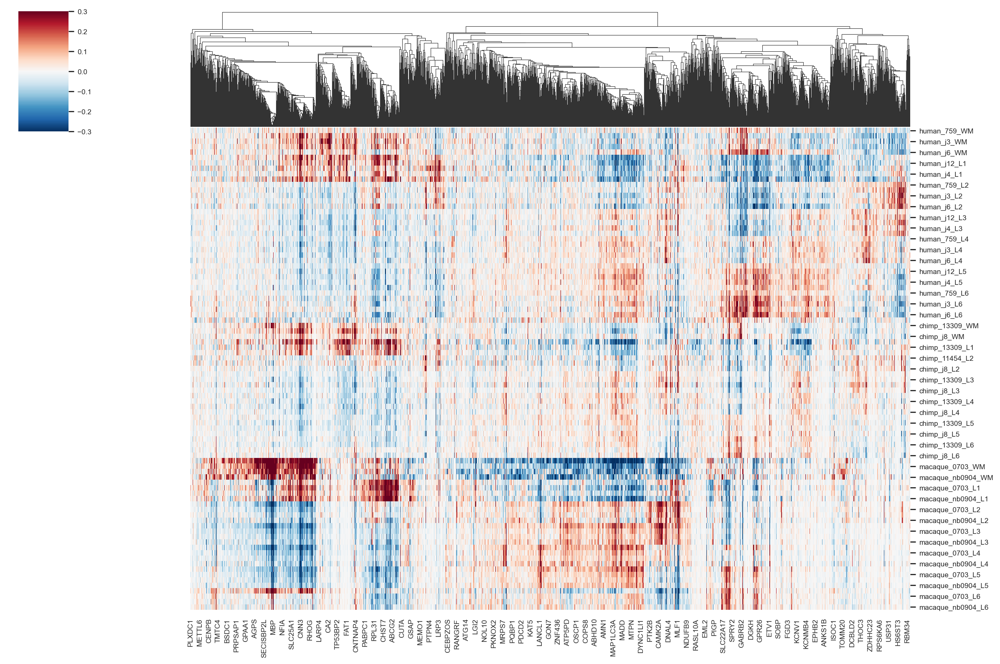

In [12]:
sns.set(font_scale=0.7)
sns.clustermap(df, figsize=(15, 10), cmap="RdBu_r", center=0, vmax=0.3, vmin=-0.3,
               metric='cosine', annot_kws={"size": 2},
               row_cluster=False).savefig('figures/heatmaps/clustermap_anova.png')

## Spectral clustering (6 clusters)

In [13]:
n_clusters= 6
labels = pd.read_csv(de_dir_path + f'cluster_spectr_anova_mean_{n_clusters}.csv', index_col=0)['0'].sort_values()
order = labels.sort_values().index

### Heatmap

In [14]:
colors = cluster_color[:n_clusters]
clusters = np.arange(n_clusters)

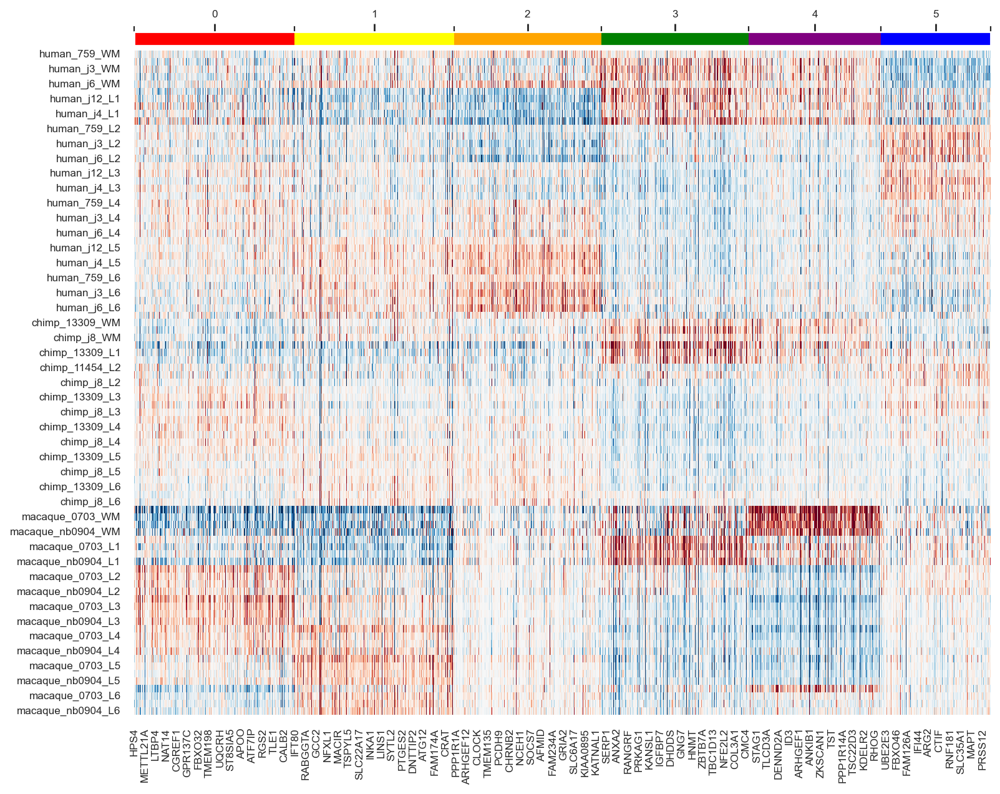

In [15]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

fig, ax = plt.subplots(figsize=(11, 9), dpi=80)
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0, cbar=False)
divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='2%', pad=0.05)
cmap = mpl.colors.ListedColormap(colors)

cluster_size = labels.value_counts().loc[clusters].values
cluster_pos = cluster_size.cumsum()
bounds = [0] + list(cluster_pos)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
fig.colorbar(
    mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
    cax=cax,
    ticks=bounds,
    orientation='horizontal',
    spacing='proportional'
)
cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
cax.xaxis.tick_top()

plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova.png')

### Heatmap for each layer

In [16]:
sc.settings.set_figure_params(dpi=80)
sns.set(font_scale=0.7)

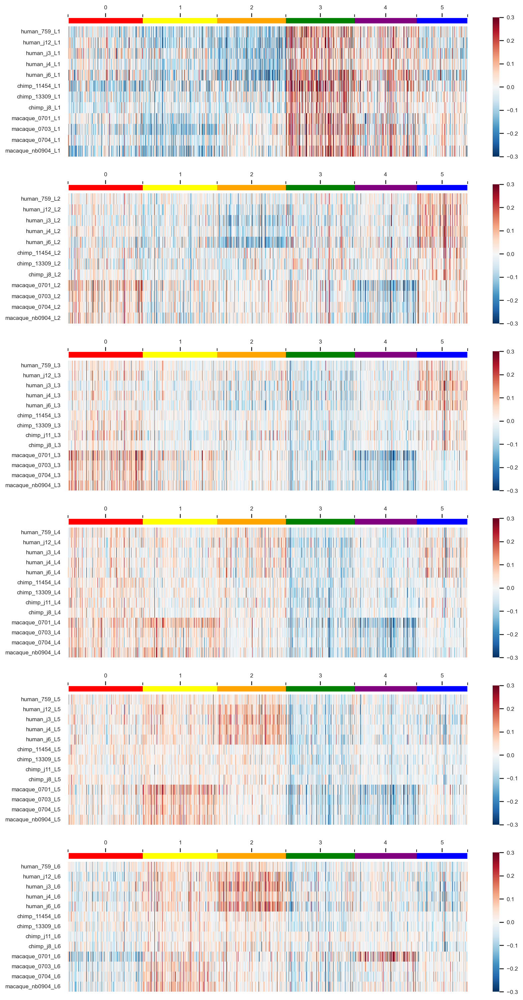

In [17]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(n_clusters, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), layers):
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order], ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top() 
plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova_sep_clusters.png')

### Snakeplot for each layer

In [18]:
df_annotation = df.copy()
df_annotation['layer'] = adata_norm_anova.obs.layer
df_annotation['condition'] = adata_norm_anova.obs.condition

In [19]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

A1BG      AACS     AADAT      AAK1     AARS1      AATK  \
condition layer                                                               
chimp     L1     0.000311 -0.067096  0.004136 -0.005820  0.015548 -0.030878   
          L2    -0.025557 -0.121551 -0.001924 -0.014660 -0.027253 -0.065565   
          L3     0.076603 -0.020433  0.028048 -0.007055 -0.005945 -0.000613   
          L4     0.062482  0.042894  0.007185 -0.018464 -0.009535  0.005079   
          L5    -0.010620  0.077460 -0.009728 -0.007488 -0.010588  0.047233   

                     ABAT     ABCA2     ABCA3     ABCA5  ...    ZNF771  \
condition layer                                          ...             
chimp     L1    -0.005831 -0.000803  0.002673 -0.069278  ...  0.103981   
          L2    -0.089762 -0.000803 -0.019373  0.024794  ... -0.042995   
          L3    -0.051850  0.003244 -0.005012  0.033964  ...  0.032819   
          L4     0.036816 -0.001952 -0.002816  0.011740  ... -0.024613   
          L5     0.086123 -0.001801 -0.002795 -0.010684  ... -0.023965   

                   ZNF791     ZNF92     ZNFX1     ZNRF3    ZSWIM5    ZSWIM6  \
condition layer                                                               
chimp     L1     0.060992  0.001364  0.044815  0.020308  0.015811  0.004193   
          L2    -0.006265  0.004805  0.007011 -0.019569 -0.002635 -0.006481   
          L3     0.006503 -0.001562 -0.014307 -0.014304 -0.002672 -0.001571   
          L4    -0.034777 -0.006946 -0.015902 -0.002362 -0.002672 -0.005166   
          L5    -0.015340 -0.008374 -0.023455 -0.019414 -0.000386 -0.001691   

                   ZWILCH    ZYG11B       ZYX  
condition layer                                
chimp     L1     0.002993 -0.007331  0.005605  
          L2     0.003258  0.005846 -0.003745  
          L3    -0.002625 -0.000610  0.003216  
          L4     0.004127  0.001754  0.003341  
          L5    -0.012560 -0.001946 -0.002624  

[5 rows x 4387 columns]

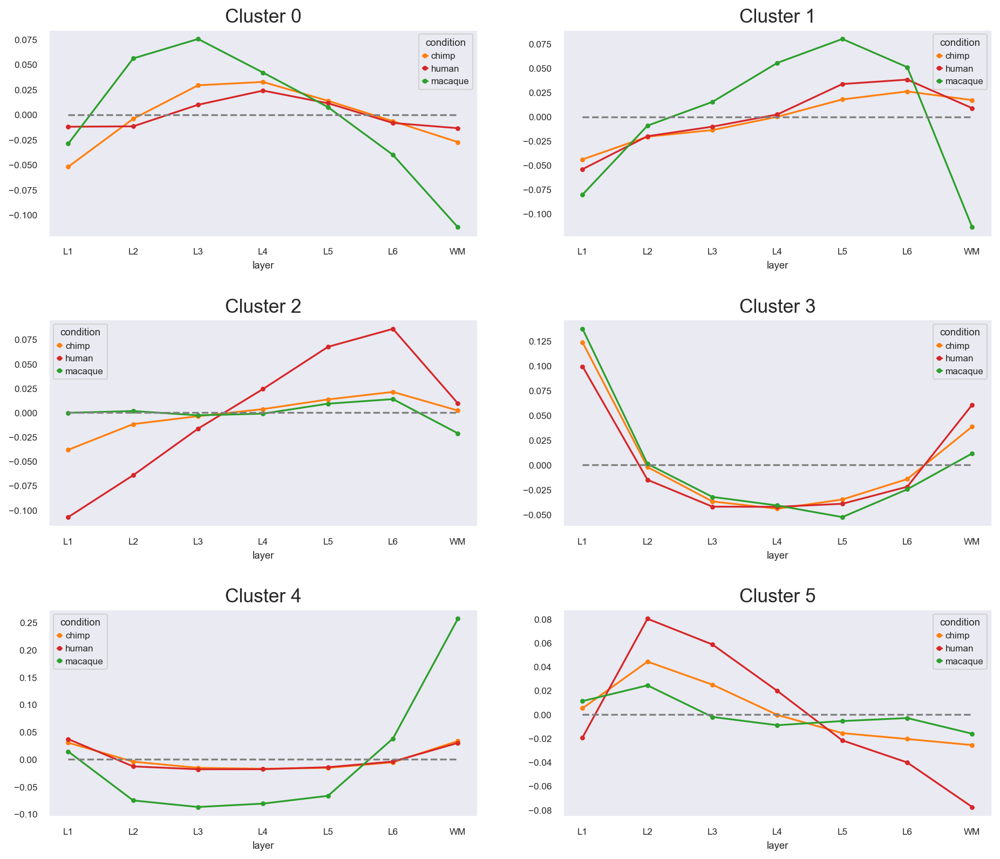

In [20]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * (n_clusters + 1)// 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
    #plt.savefig(f'figures/snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.png', bbox_inches='tight')
    #plt.savefig(f'figures/snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.pdf', bbox_inches='tight')

### Z-scored Heatmap

In [21]:
df_zscored = (df - df.mean()) / df.std()

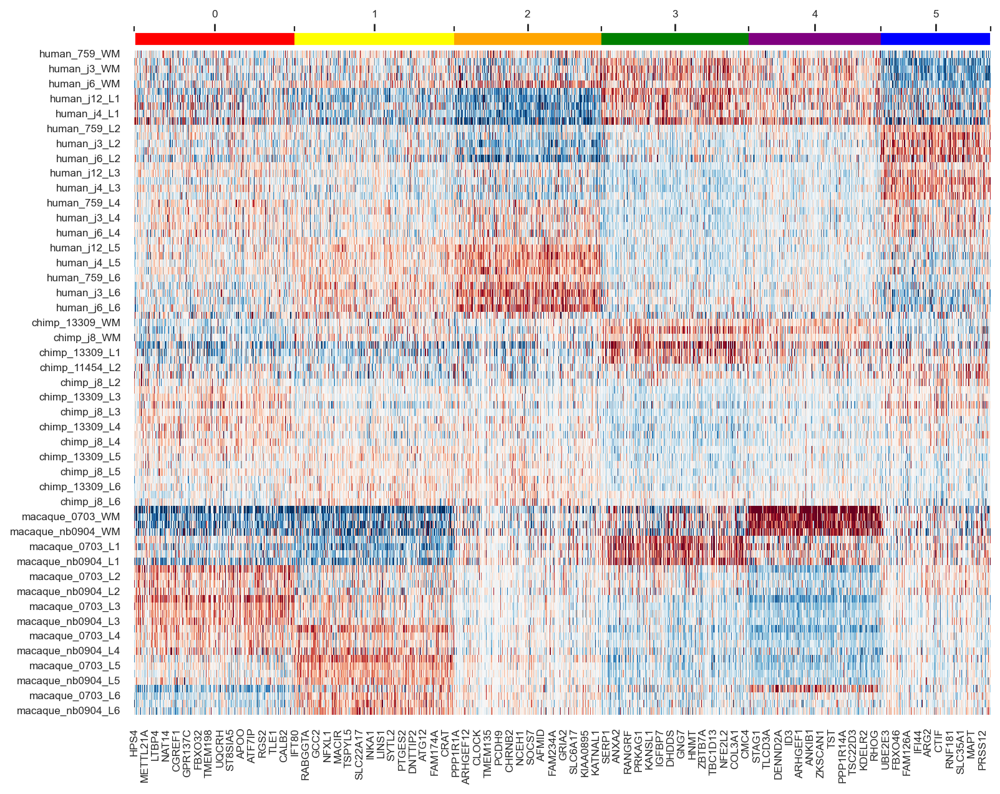

In [22]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

fig, ax = plt.subplots(figsize=(11, 9), dpi=80)
sns.heatmap(df_zscored.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0, cbar=False)
divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='2%', pad=0.05)
cmap = mpl.colors.ListedColormap(colors)

cluster_size = labels.value_counts().loc[clusters].values
cluster_pos = cluster_size.cumsum()
bounds = [0] + list(cluster_pos)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
fig.colorbar(
    mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
    cax=cax,
    ticks=bounds,
    orientation='horizontal',
    spacing='proportional'
)
cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
cax.xaxis.tick_top()

plt.savefig(f'figures/heatmaps/heatmap_spectr_zscored{n_clusters}_anova.png')

### T-test significant for human comparisons

In [23]:
genes_hs = ttest_res[(ttest_res.group1 == 'human') & (ttest_res.p_val_adj < 0.05)].gene.unique()
order_hs = order.intersection(genes_hs)
df_hs = df.loc[sample_order['all'], order_hs].copy()

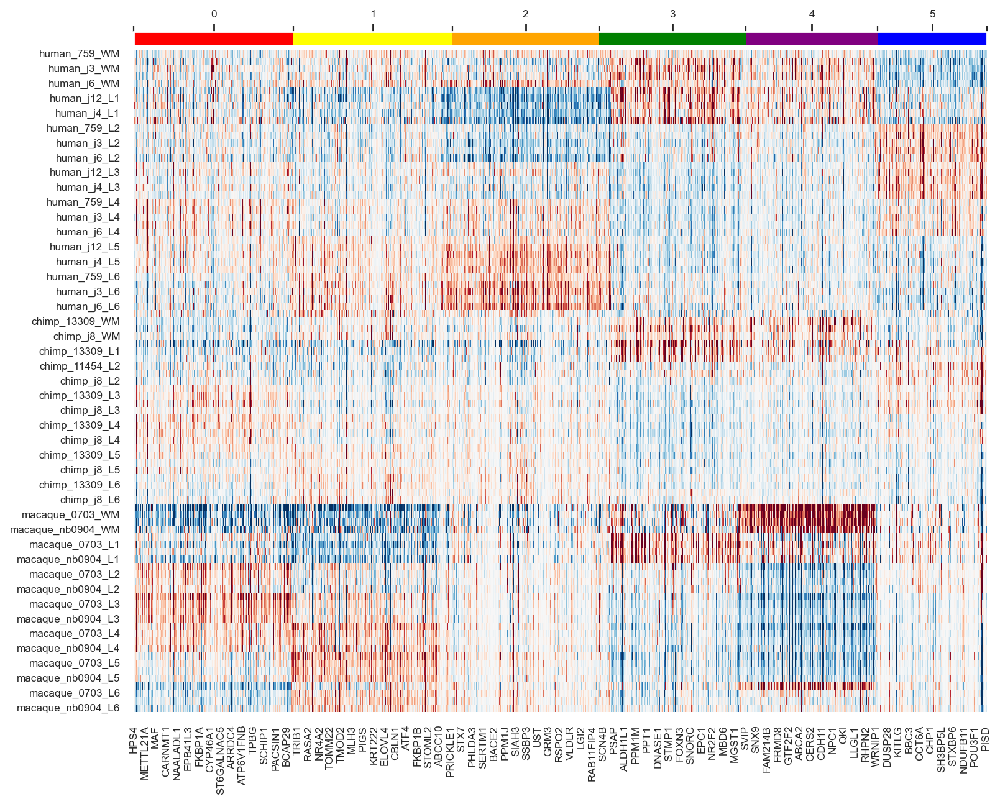

In [24]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

fig, ax = plt.subplots(figsize=(11, 9), dpi=80)
sns.heatmap(df_hs, ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0, cbar=False)
divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='2%', pad=0.05)
cmap = mpl.colors.ListedColormap(colors)

cluster_size = labels.value_counts().loc[clusters].values
cluster_pos = cluster_size.cumsum()
bounds = [0] + list(cluster_pos)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
fig.colorbar(
    mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
    cax=cax,
    ticks=bounds,
    orientation='horizontal',
    spacing='proportional'
)
cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
cax.xaxis.tick_top()

plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova_hs.png')

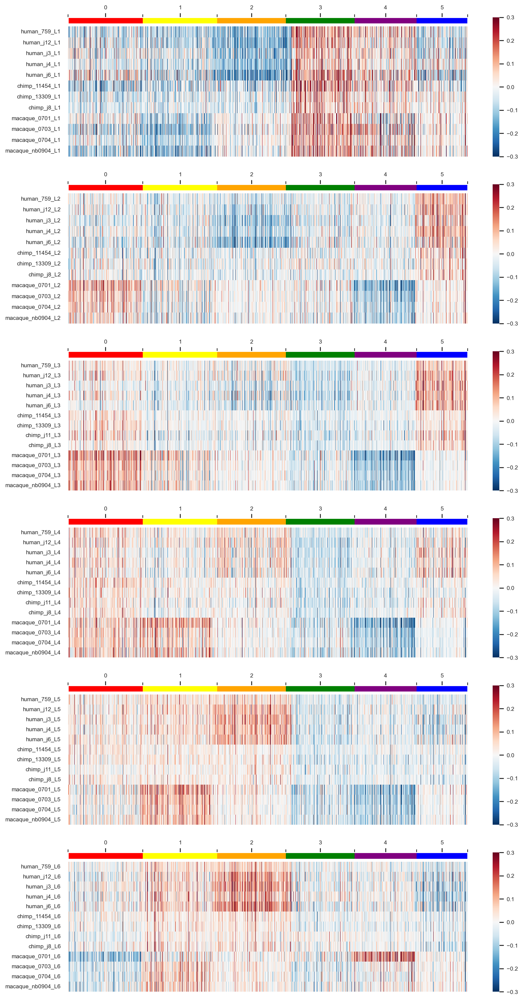

In [25]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(n_clusters, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), layers):
    df_layer = df_hs.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer, ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top() 
plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova_hs_layers.png', bbox_inches='tight')
#plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova_hs_layers.pdf', bbox_inches='tight')

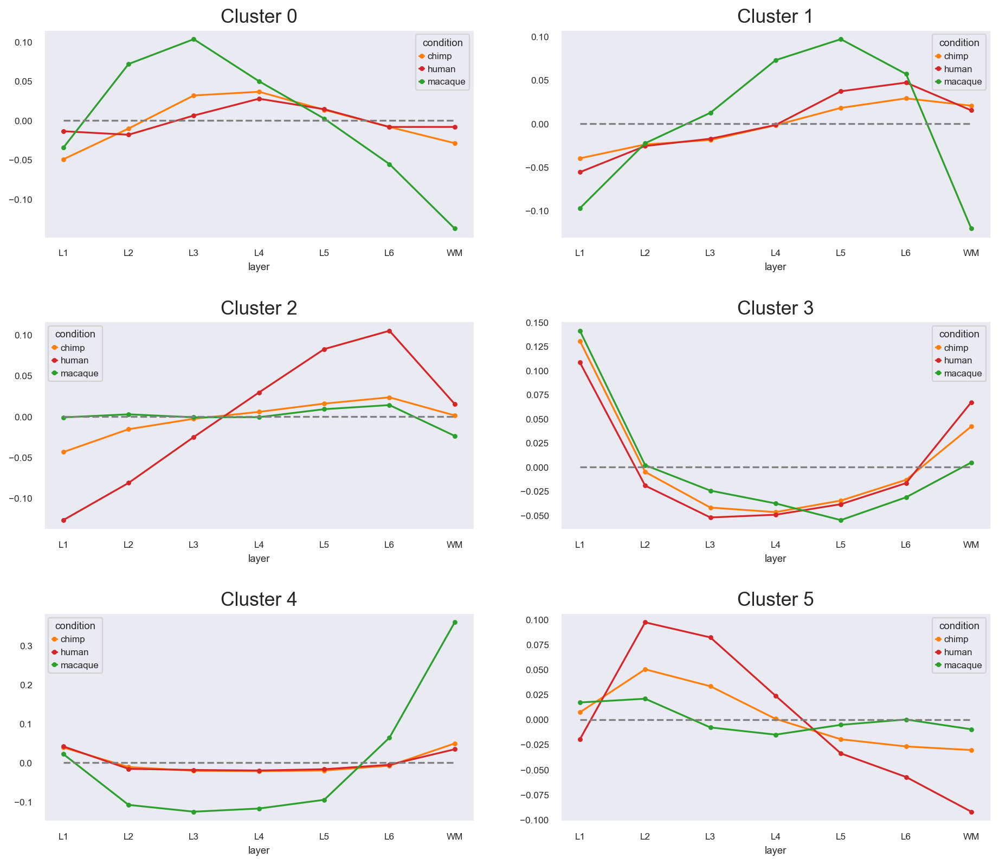

In [26]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * (n_clusters + 1)// 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels.loc[order_hs][labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
    #plt.savefig(f'figures/snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.png', bbox_inches='tight')
    #plt.savefig(f'figures/snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.pdf', bbox_inches='tight')

### Snakeplot

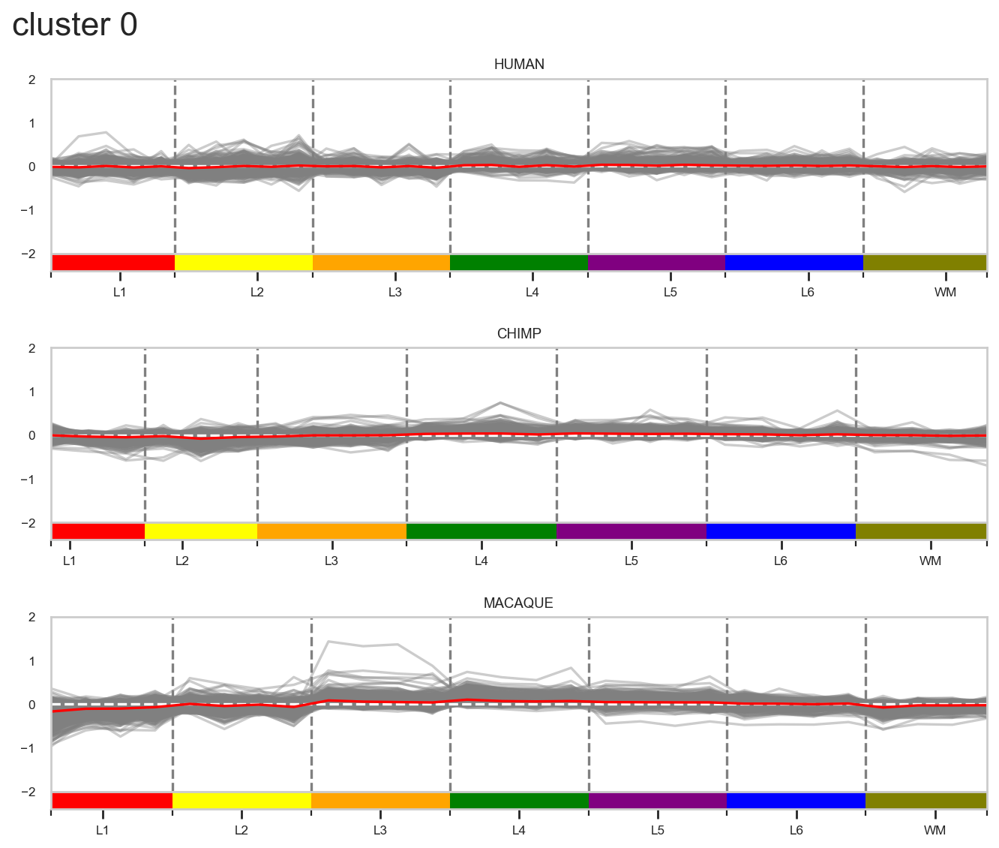

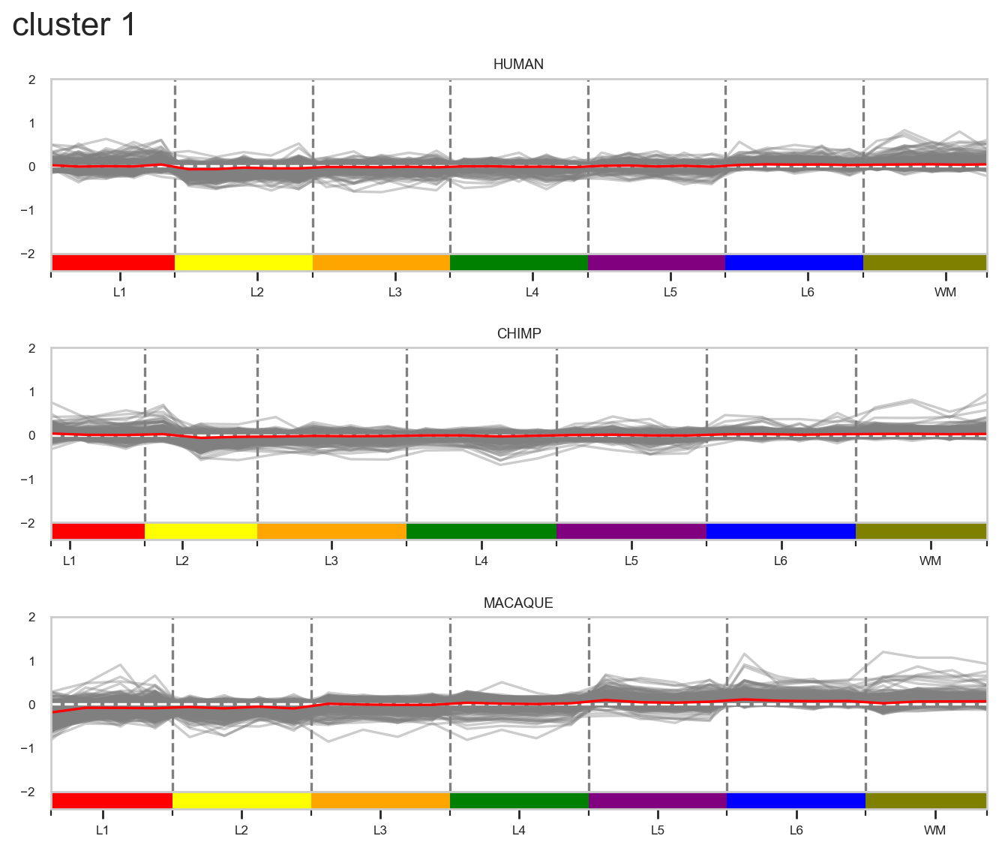

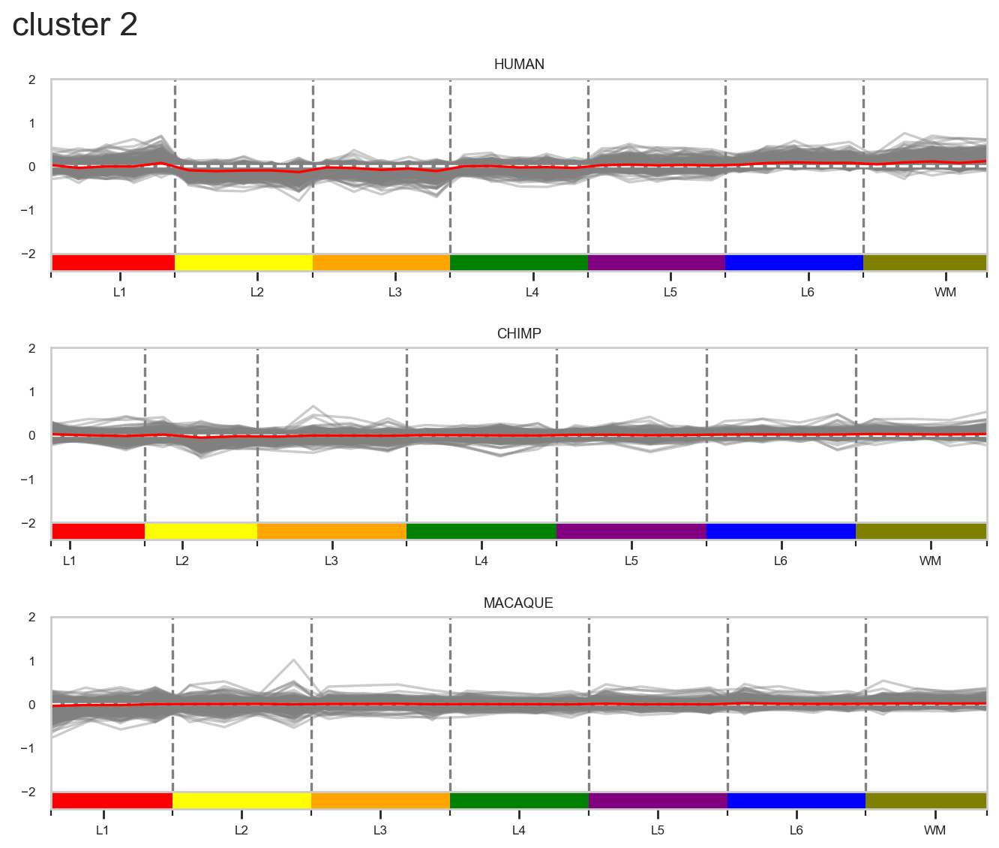

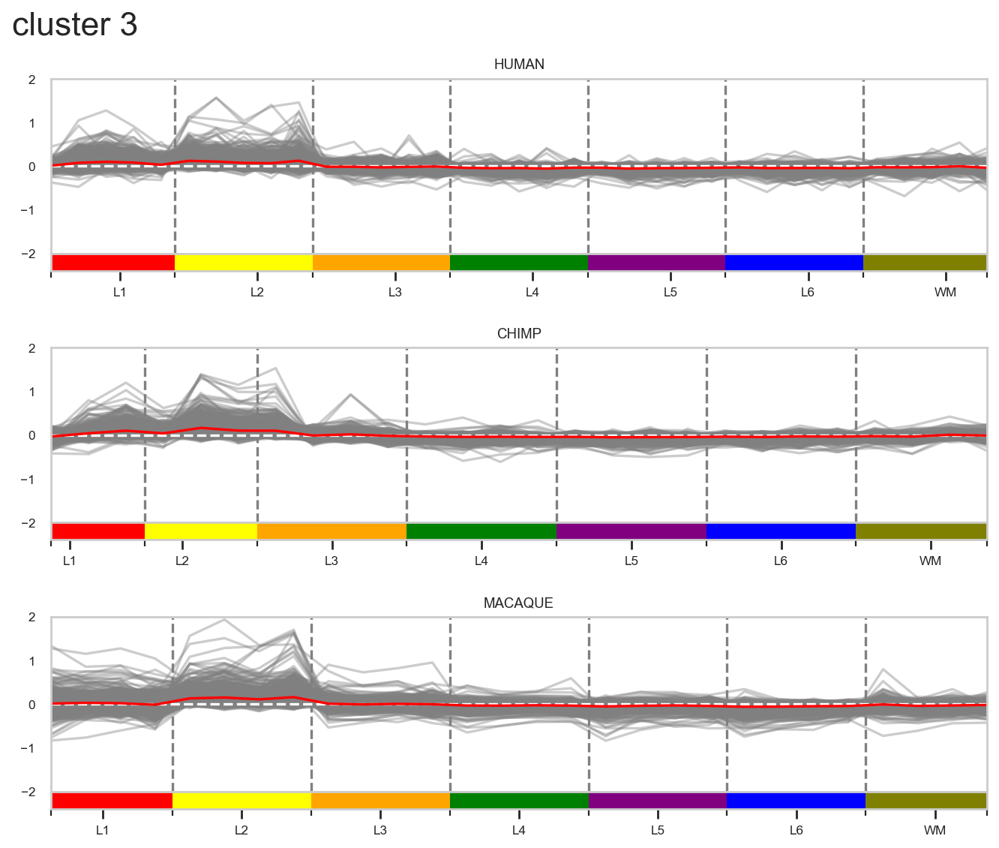

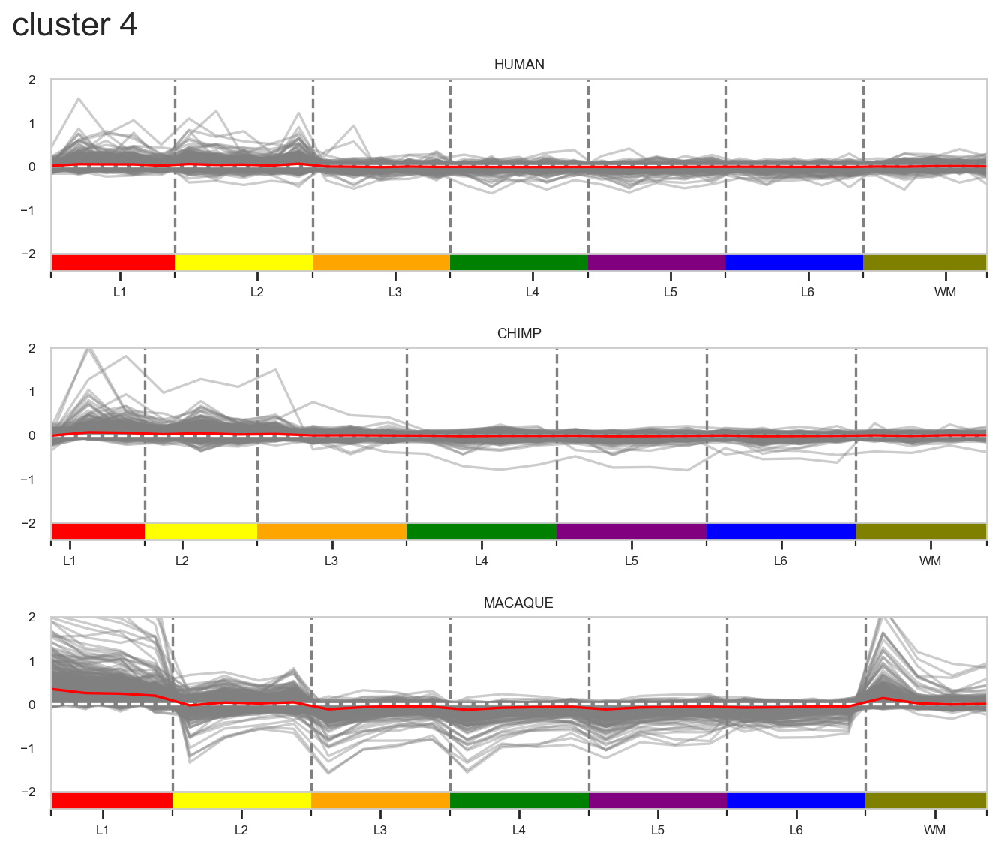

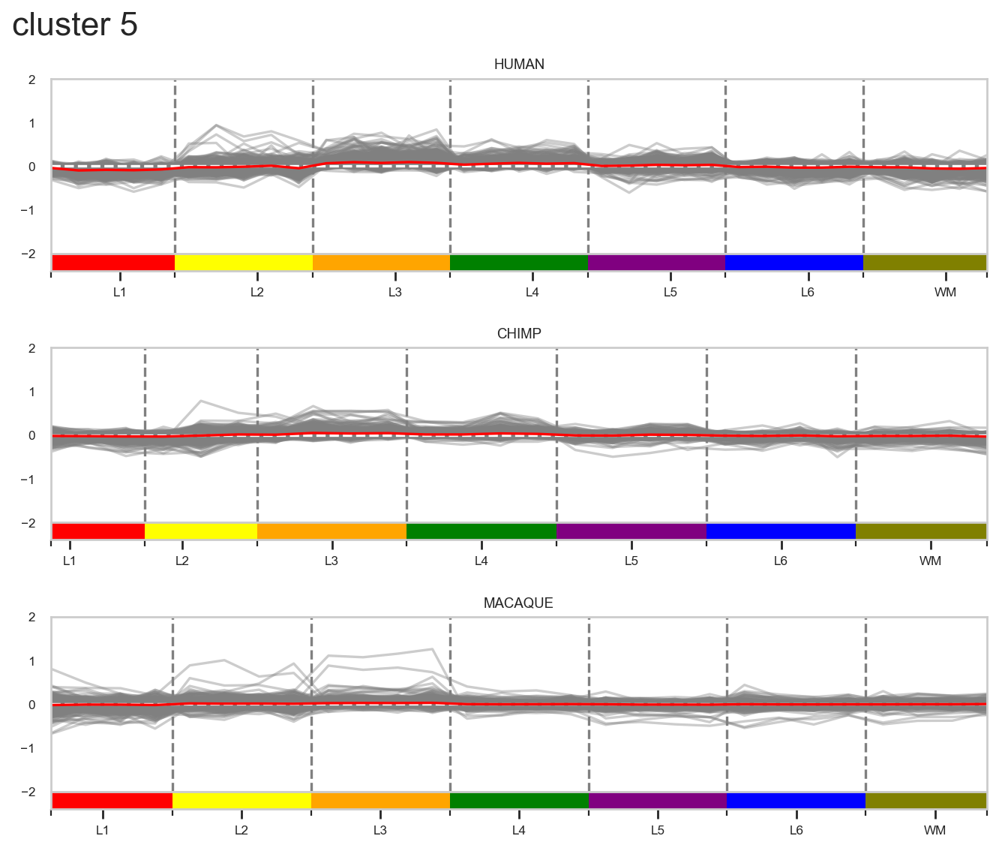

In [27]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker
sns.set_style("whitegrid")

clusters = np.arange(n_clusters)
colors = cluster_color[:7]

for label in clusters:
    genes = labels[labels == label].index.tolist()

    fig, axes = plt.subplots(3, 1, figsize=(10, 8), gridspec_kw={'hspace': 0.4})
    fig.suptitle(f'cluster {label}', fontsize=20, x=0.2)

    for ax, cond in zip(axes, ['human', 'chimp', 'macaque']):
        # subset df
        df_snake = df.loc[sample_order[cond], genes]
        # count number of samples for each layer
        lines = [sum(map(lambda x: layer in x, sample_order[cond])) for layer in layers]
        # position for layer boarders
        layer_pos = np.cumsum(lines) - 1
        # min and max values
        ymin, ymax = -2, 2
        # sample mean
        sample_mean = df_snake.mean(axis=1)
        # ploting
        ax.plot(np.arange(len(sample_mean)), df_snake, '-', color='grey', alpha=0.4)
        ax.vlines(layer_pos + 0.5, ymin=ymin, ymax=ymax, colors='grey', linestyles='dashed')
        ax.hlines(0, xmin=0, xmax=len(sample_mean) - 1, colors='white', linestyles='dashed')
        ax.plot(np.arange(len(sample_mean)), sample_mean, 'red')
        # customize
        ax.grid(False)
        ax.xaxis.set_major_locator(ticker.NullLocator())
        ax.set_title(cond.upper())
        ax.set_xlim(0, len(sample_mean) - 1)
        ax.set_ylim(ymin, ymax)
        # create colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes('bottom', size='10%', pad=0)
        cmap = mpl.colors.ListedColormap(colors)

        bounds = [0] + list(layer_pos + 0.5)
        bounds[-1] = bounds[-1] - 0.5
        norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
        fig.colorbar(
            mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
            cax=cax,
            ticks=bounds,
            orientation='horizontal',
            spacing='proportional'
        )
        cax.xaxis.set_major_locator(ticker.FixedLocator(layer_pos - 1.5))
        cax.xaxis.set_major_formatter(ticker.FixedFormatter(layers))
    plt.savefig(f'figures/snakeplots/snakeplot_samples_cluster{n_clusters}_{label}.png', bbox_inches='tight')
    #plt.savefig(f'figures/snakeplots/snakeplot_samples_cluster{n_clusters}_{label}.pdf', bbox_inches='tight')

In [28]:
df_annotatin = df.copy()
df_annotatin['layer'] = adata_norm_anova.obs.layer
df_annotatin['condition'] = adata_norm_anova.obs.condition
df_annotatin.head()

,A1BG,AACS,AADAT,AAK1,AARS1,AATK,ABAT,ABCA2,ABCA3,ABCA5,...,ZNF92,ZNFX1,ZNRF3,ZSWIM5,ZSWIM6,ZWILCH,ZYG11B,ZYX,layer,condition
human_759_WM,-0.065495,0.041268,-0.054351,-0.072019,0.007453,-0.036537,-0.003708,0.000981,0.004642,-0.147044,...,-0.019168,0.002537,-0.044088,0.036042,-0.025797,0.041762,-0.026634,-0.087689,WM,human
human_j12_WM,-0.060239,0.025153,-0.066483,0.001885,0.064853,0.019544,0.007084,-0.026349,0.017147,-0.132685,...,-0.102125,0.029141,0.036802,0.008039,-0.011982,-0.051615,-0.144635,-0.030077,WM,human
human_j3_WM,-0.095841,-0.028083,-0.100378,0.121080,-0.017252,-0.081690,0.053134,0.033085,-0.055234,-0.048987,...,-0.034854,0.026583,0.131115,-0.025040,0.025672,-0.082378,-0.050937,-0.060124,WM,human
human_j4_WM,-0.091943,-0.020194,-0.100982,0.040012,0.055494,-0.047963,0.159400,0.006362,0.026030,0.014880,...,-0.011414,0.055548,0.012012,-0.031159,-0.014967,-0.117408,-0.020468,-0.110733,WM,human
human_j6_WM,-0.078252,0.004524,-0.134850,0.078731,-0.074468,0.007142,0.013736,-0.082062,0.098298,0.041546,...,0.024004,-0.049726,-0.023704,0.052648,-0.099636,-0.005066,0.020878,-0.112694,WM,human


In [29]:
layer_mean = df_annotatin.groupby(['condition', 'layer']).mean()
layer_mean.head()

A1BG      AACS     AADAT      AAK1     AARS1      AATK  \
condition layer                                                               
chimp     L1     0.000311 -0.067096  0.004136 -0.005820  0.015548 -0.030878   
          L2    -0.025557 -0.121551 -0.001924 -0.014660 -0.027253 -0.065565   
          L3     0.076603 -0.020433  0.028048 -0.007055 -0.005945 -0.000613   
          L4     0.062482  0.042894  0.007185 -0.018464 -0.009535  0.005079   
          L5    -0.010620  0.077460 -0.009728 -0.007488 -0.010588  0.047233   

                     ABAT     ABCA2     ABCA3     ABCA5  ...    ZNF771  \
condition layer                                          ...             
chimp     L1    -0.005831 -0.000803  0.002673 -0.069278  ...  0.103981   
          L2    -0.089762 -0.000803 -0.019373  0.024794  ... -0.042995   
          L3    -0.051850  0.003244 -0.005012  0.033964  ...  0.032819   
          L4     0.036816 -0.001952 -0.002816  0.011740  ... -0.024613   
          L5     0.086123 -0.001801 -0.002795 -0.010684  ... -0.023965   

                   ZNF791     ZNF92     ZNFX1     ZNRF3    ZSWIM5    ZSWIM6  \
condition layer                                                               
chimp     L1     0.060992  0.001364  0.044815  0.020308  0.015811  0.004193   
          L2    -0.006265  0.004805  0.007011 -0.019569 -0.002635 -0.006481   
          L3     0.006503 -0.001562 -0.014307 -0.014304 -0.002672 -0.001571   
          L4    -0.034777 -0.006946 -0.015902 -0.002362 -0.002672 -0.005166   
          L5    -0.015340 -0.008374 -0.023455 -0.019414 -0.000386 -0.001691   

                   ZWILCH    ZYG11B       ZYX  
condition layer                                
chimp     L1     0.002993 -0.007331  0.005605  
          L2     0.003258  0.005846 -0.003745  
          L3    -0.002625 -0.000610  0.003216  
          L4     0.004127  0.001754  0.003341  
          L5    -0.012560 -0.001946 -0.002624  

[5 rows x 4387 columns]

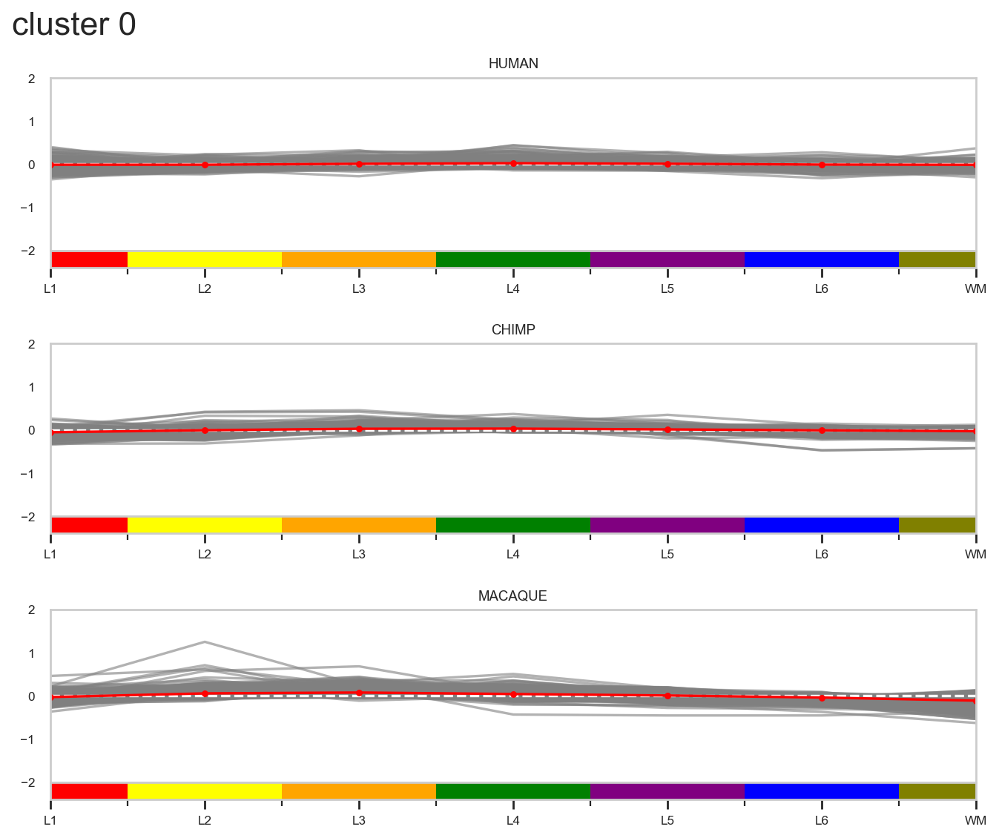

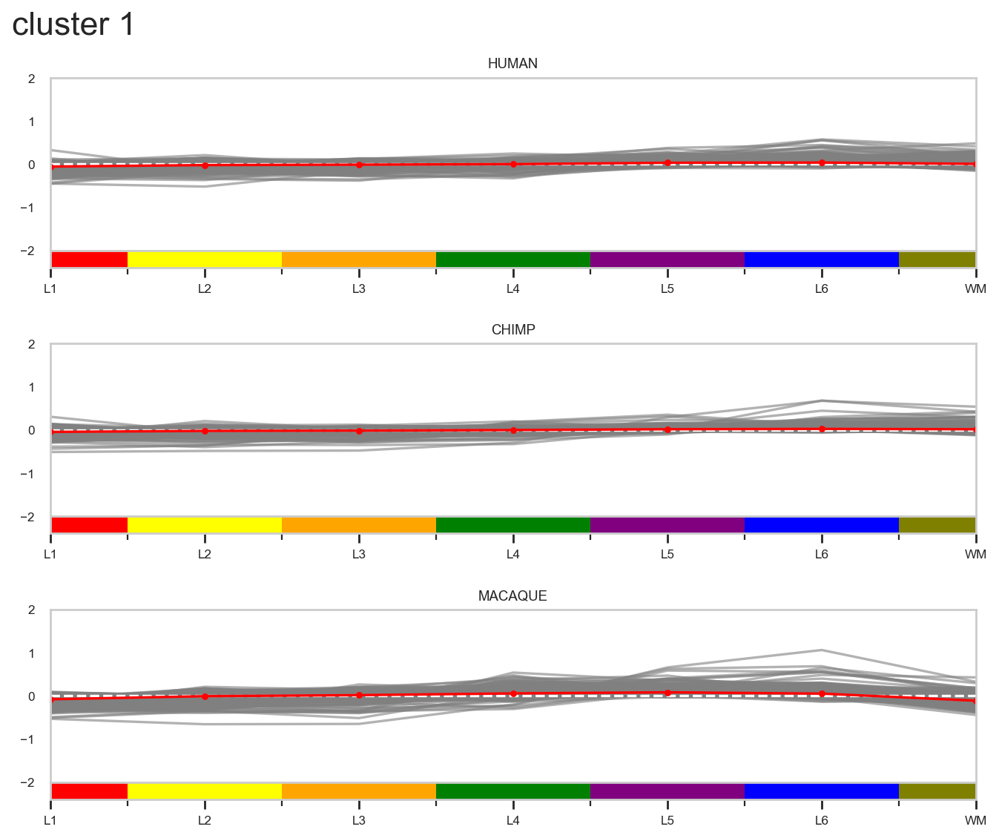

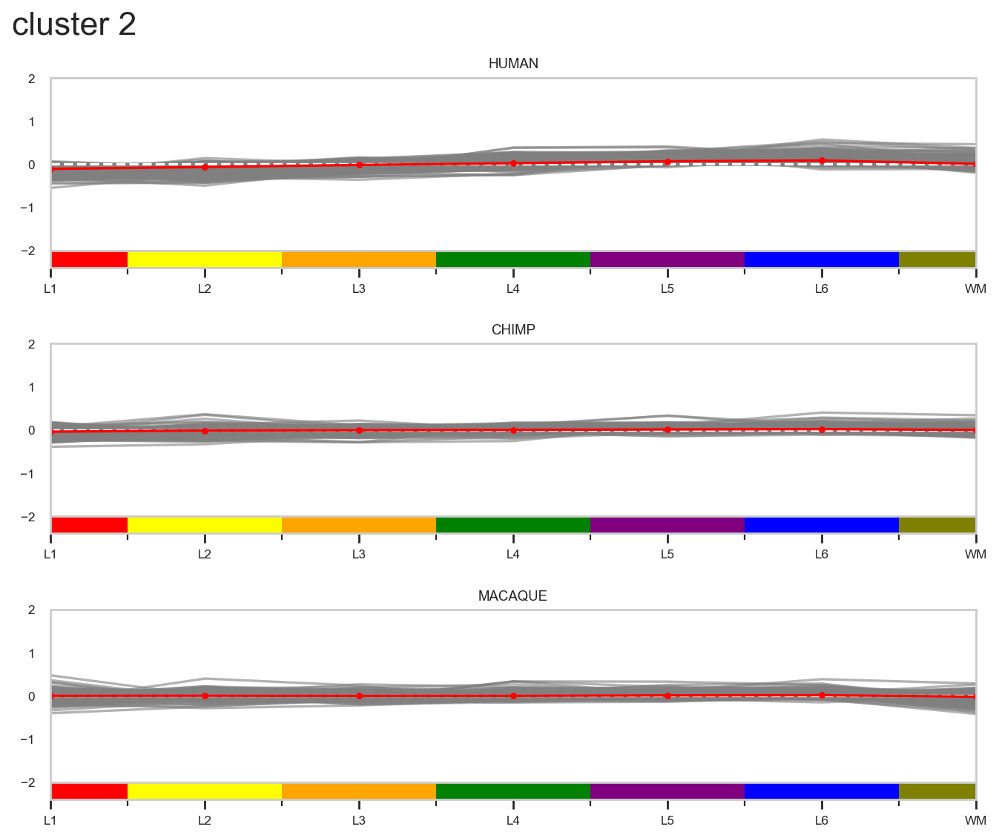

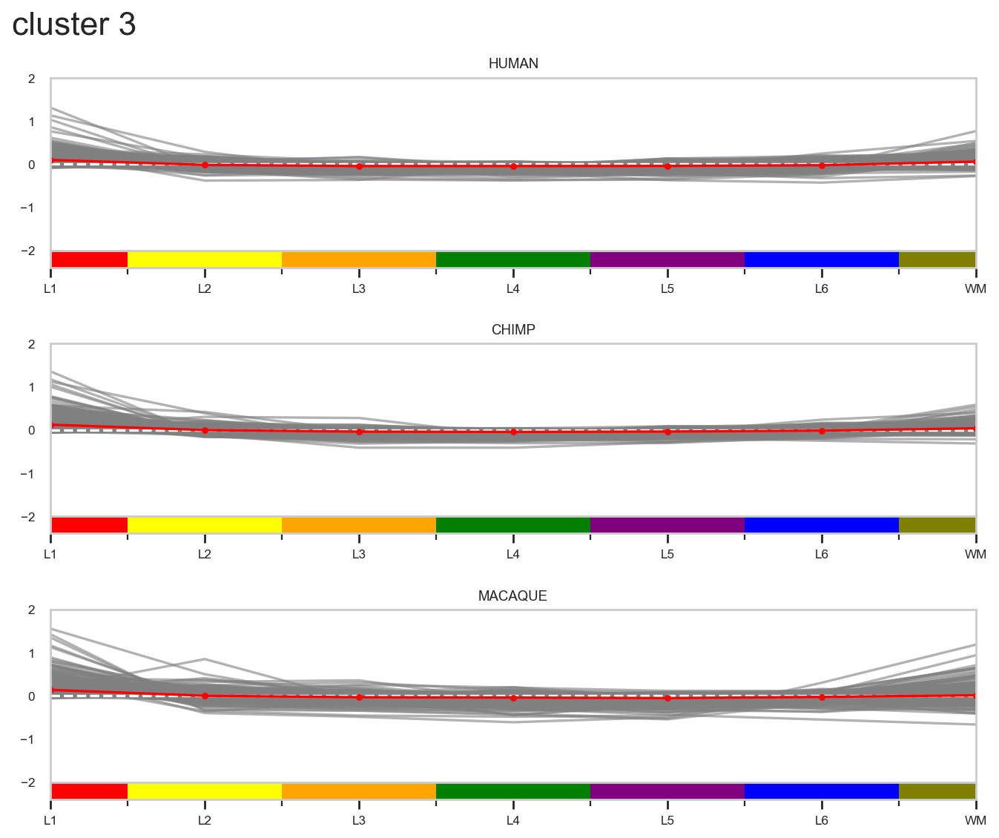

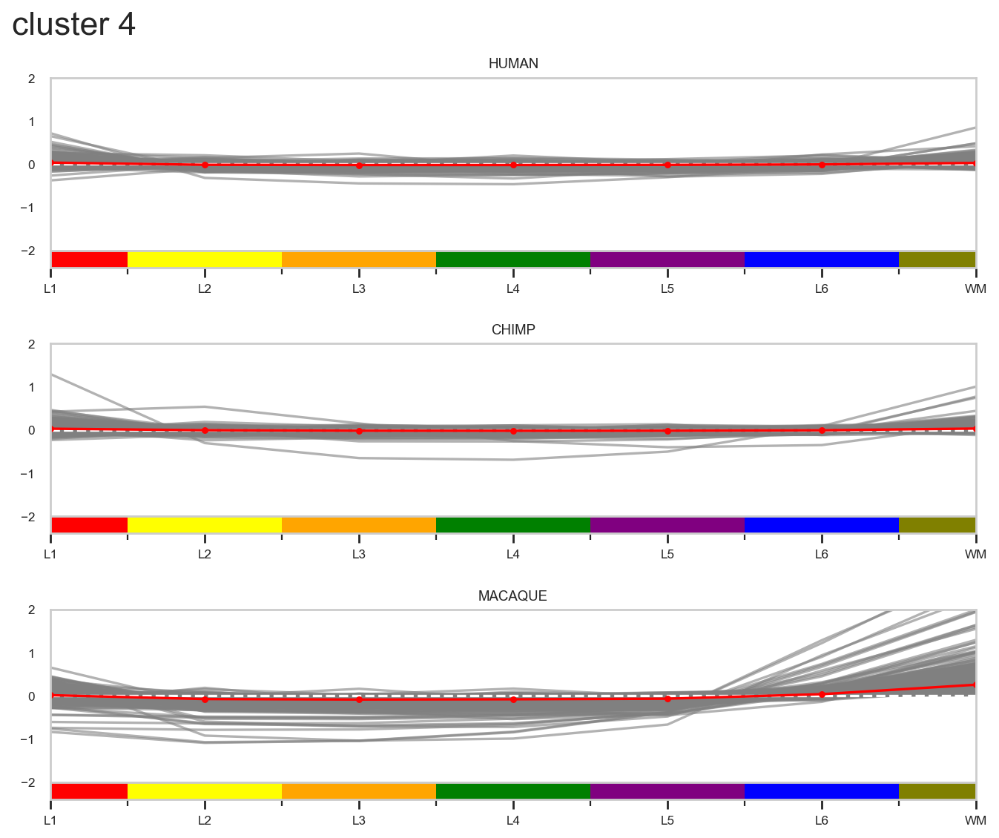

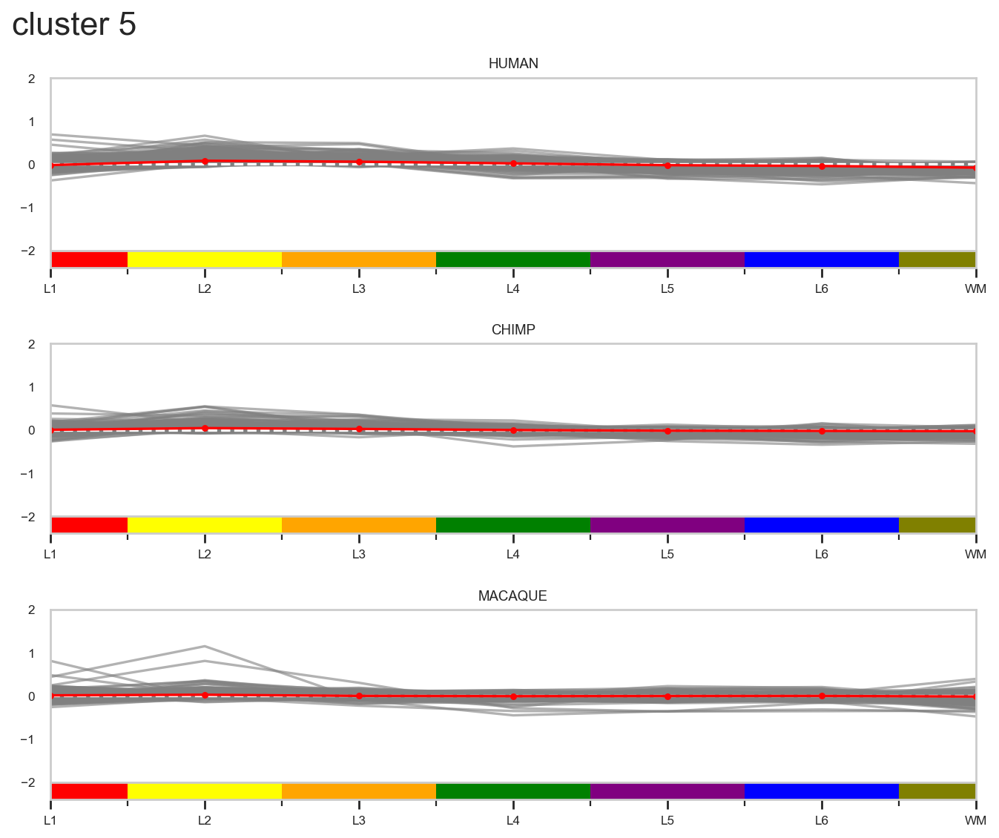

In [30]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

clusters = np.arange(n_clusters)
colors = cluster_color[:7]

for label in clusters:
    genes = labels[labels == label].index.tolist()

    fig, axes = plt.subplots(3, 1, figsize=(10, 8), gridspec_kw={'hspace': 0.4})
    fig.suptitle(f'cluster {label}', fontsize=20, x=0.2)

    for ax, cond in zip(axes, ['human', 'chimp', 'macaque']):
        # subset df
        df_snake = layer_mean.loc[cond, genes].loc[layers]
        # position for layers
        layer_pos = np.arange(7)
        # min and max values
        ymin, ymax = -2, 2
        # sample mean
        sample_mean = df_snake.mean(axis=1)
        # ploting
        ax.plot(layer_pos, df_snake, '-', color='grey', alpha=0.6)
        ax.hlines(0, xmin=0, xmax=6, colors='white', linestyles='dashed')
        ax.plot(layer_pos, sample_mean, '.-', color='red')
        # customize
        ax.grid(False)
        ax.xaxis.set_major_locator(ticker.NullLocator())
        ax.set_title(cond.upper())
        ax.set_xlim(0, 6)
        ax.set_ylim(ymin, ymax)
        # create colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes('bottom', size='10%', pad=0)
        cmap = mpl.colors.ListedColormap(colors)

        bounds = [0] + list(layer_pos + 0.5)
        bounds[-1] = bounds[-1] - 0.5
        norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
        fig.colorbar(
            mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
            cax=cax,
            ticks=bounds,
            orientation='horizontal',
            spacing='proportional'
        )
        cax.xaxis.set_major_locator(ticker.FixedLocator(layer_pos))
        cax.xaxis.set_major_formatter(ticker.FixedFormatter(layers))
    plt.savefig(f'figures/snakeplots/snakeplot_layers_cluster{n_clusters}_{label}.png', bbox_inches='tight')
    #plt.savefig(f'figures/snakeplots/snakeplot_layers_cluster{label}.pdf', bbox_inches='tight')

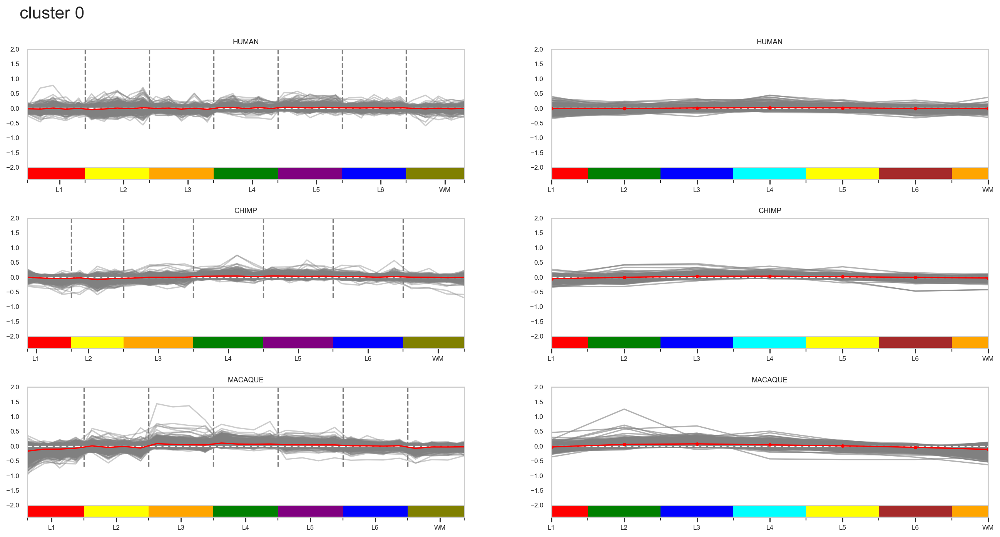

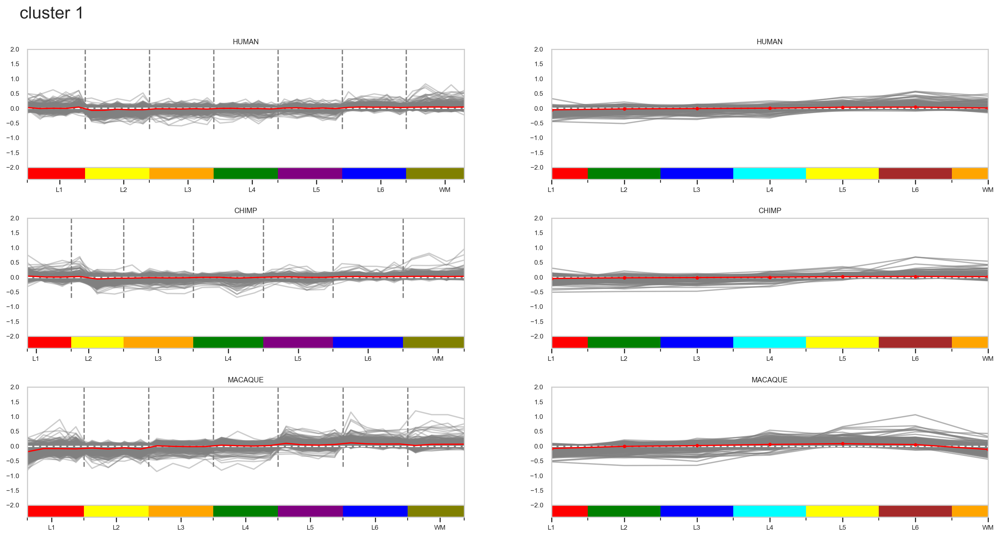

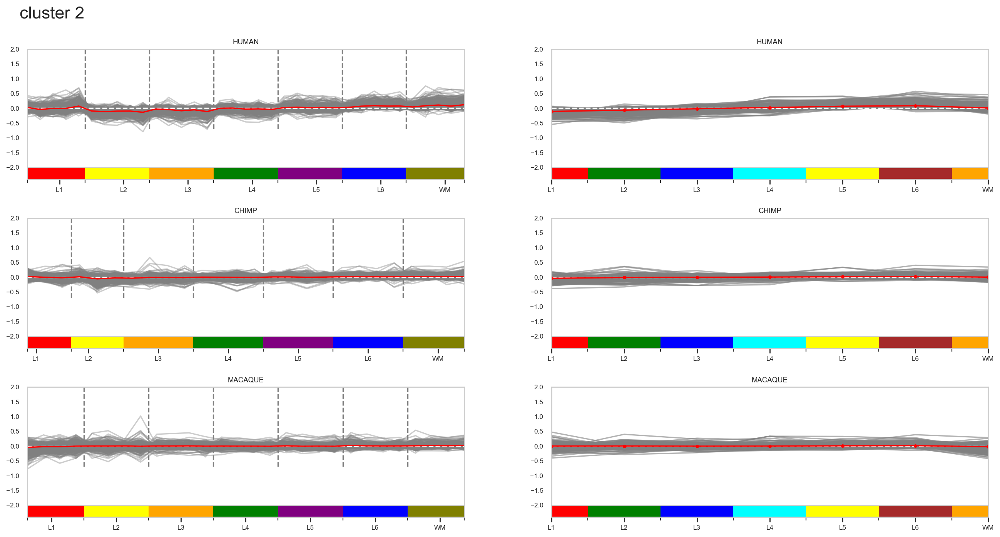

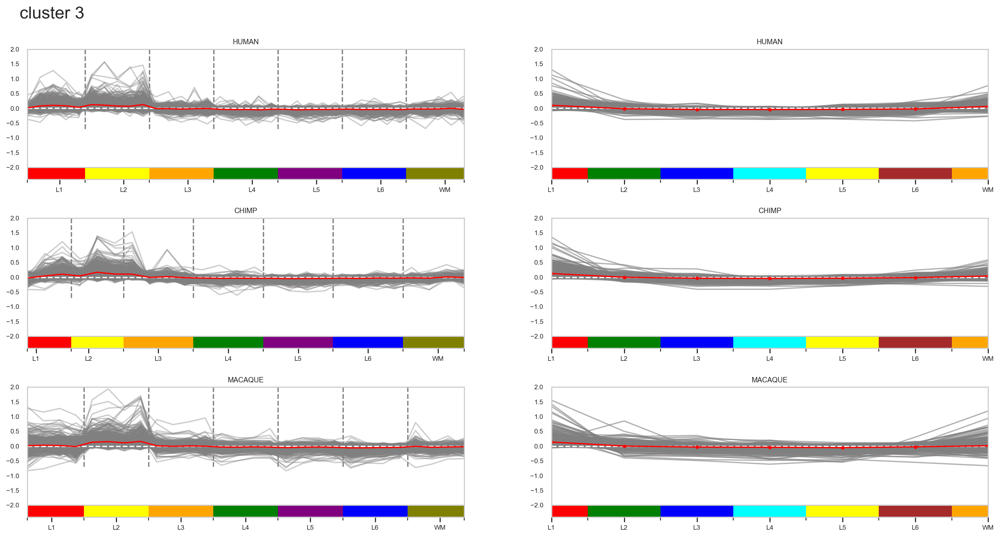

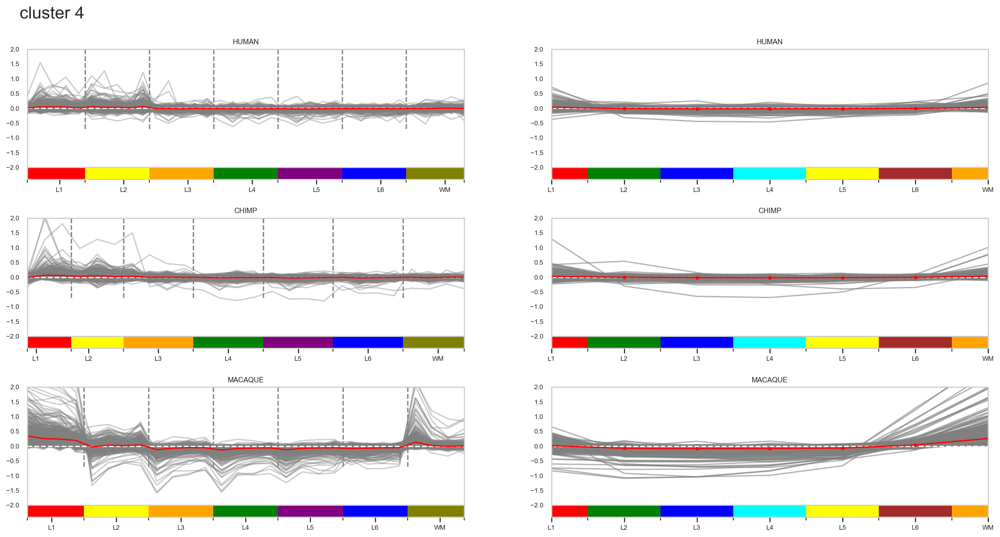

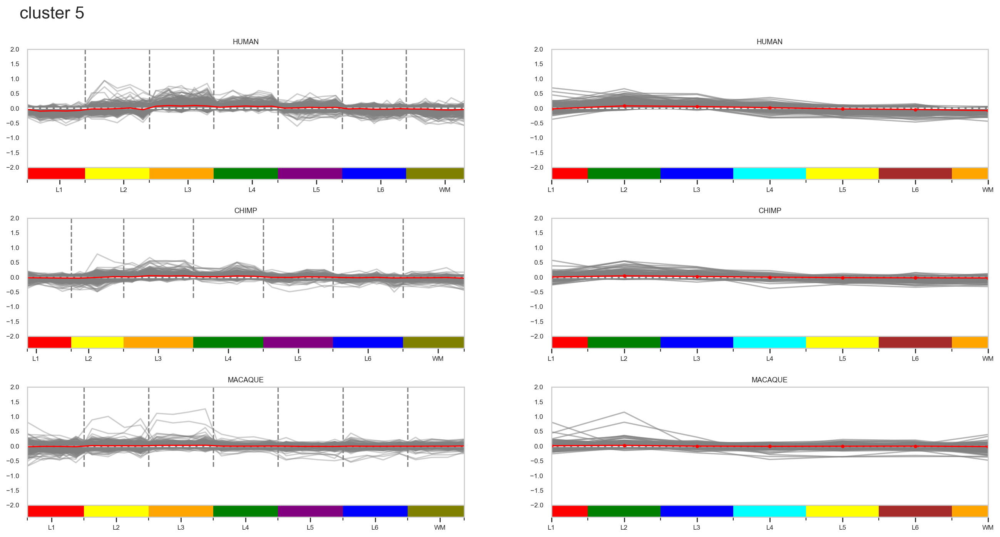

In [31]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:7]

for label in clusters:
    genes = labels[labels == label].index.tolist()

    fig, axes = plt.subplots(3, 2, figsize=(20, 10), gridspec_kw={'hspace': 0.3})
    fig.suptitle(f'cluster {label}', fontsize=20, x=0.2)

    for ax, cond in zip(axes[:, 0], ['human', 'chimp', 'macaque']):
        # subset df
        df_snake = df.loc[sample_order[cond], genes]
        # count number of samples for each layer
        lines = [sum(map(lambda x: layer in x, sample_order[cond])) for layer in layers]
        # position for layer boarders
        layer_pos = np.cumsum(lines) - 1
        # min and max values
        ymin, ymax = -2, 2
        # sample mean
        sample_mean = df_snake.mean(axis=1)
        # ploting
        ax.plot(np.arange(len(sample_mean)), df_snake, '-', color='grey', alpha=0.4)
        ax.vlines(layer_pos + 0.5, ymin=-0.7, ymax=ymax, colors='grey', linestyles='dashed')
        ax.hlines(0, xmin=0, xmax=len(sample_mean) - 1, colors='white', linestyles='dashed')
        ax.plot(np.arange(len(sample_mean)), sample_mean, 'red')
        # customize
        ax.grid(False)
        ax.xaxis.set_major_locator(ticker.NullLocator())
        ax.set_title(cond.upper())
        ax.set_xlim(0, len(sample_mean) - 1)
        ax.set_ylim(ymin, ymax)
        # create colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes('bottom', size='10%', pad=0)
        cmap = mpl.colors.ListedColormap(colors)

        bounds = [0] + list(layer_pos + 0.5)
        bounds[-1] = bounds[-1] - 0.5
        norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
        fig.colorbar(
            mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
            cax=cax,
            ticks=bounds,
            orientation='horizontal',
            spacing='proportional'
        )
        cax.xaxis.set_major_locator(ticker.FixedLocator(layer_pos - 1.5))
        cax.xaxis.set_major_formatter(ticker.FixedFormatter(layers))

    for ax, cond in zip(axes[:, 1], ['human', 'chimp', 'macaque']):
        # subset df
        df_snake = layer_mean.loc[cond, genes].loc[layers]
        # position for layers
        layer_pos = np.arange(7)
        # min and max values
        ymin, ymax = -2, 2
        # sample mean
        sample_mean = df_snake.mean(axis=1)
        # ploting
        ax.plot(layer_pos, df_snake, '-', color='grey', alpha=0.6)
        ax.hlines(0, xmin=0, xmax=6, colors='white', linestyles='dashed')
        ax.plot(layer_pos, sample_mean, '.-', color='red')
        # customize
        ax.grid(False)
        ax.xaxis.set_major_locator(ticker.NullLocator())
        ax.set_title(cond.upper())
        ax.set_xlim(0, 6)
        ax.set_ylim(ymin, ymax)
        # create colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes('bottom', size='10%', pad=0)
        cmap = mpl.colors.ListedColormap(['red', 'green', 'blue', 'cyan', 'yellow', 'brown', 'orange'])

        bounds = [0] + list(layer_pos + 0.5)
        bounds[-1] = bounds[-1] - 0.5
        norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
        fig.colorbar(
            mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
            cax=cax,
            ticks=bounds,
            orientation='horizontal',
            spacing='proportional'
        )
        cax.xaxis.set_major_locator(ticker.FixedLocator(layer_pos))
        cax.xaxis.set_major_formatter(ticker.FixedFormatter(layers))
    plt.savefig(f'figures/snakeplots/snakeplot_samples_layers_cluster{n_clusters}_{label}.png', bbox_inches='tight')
    #plt.savefig(f'figures/snakeplots/snakeplot_samples_layers_cluster{label}.pdf', bbox_inches='tight')

## Spectral clustering (7 clusters)

In [32]:
n_clusters= 7
labels = pd.read_csv(de_dir_path + f'cluster_spectr_anova_mean_{n_clusters}.csv', index_col=0)['0'].sort_values()
order = labels.sort_values().index

### Heatmap

In [33]:
colors = cluster_color[:n_clusters]
clusters = np.arange(n_clusters)

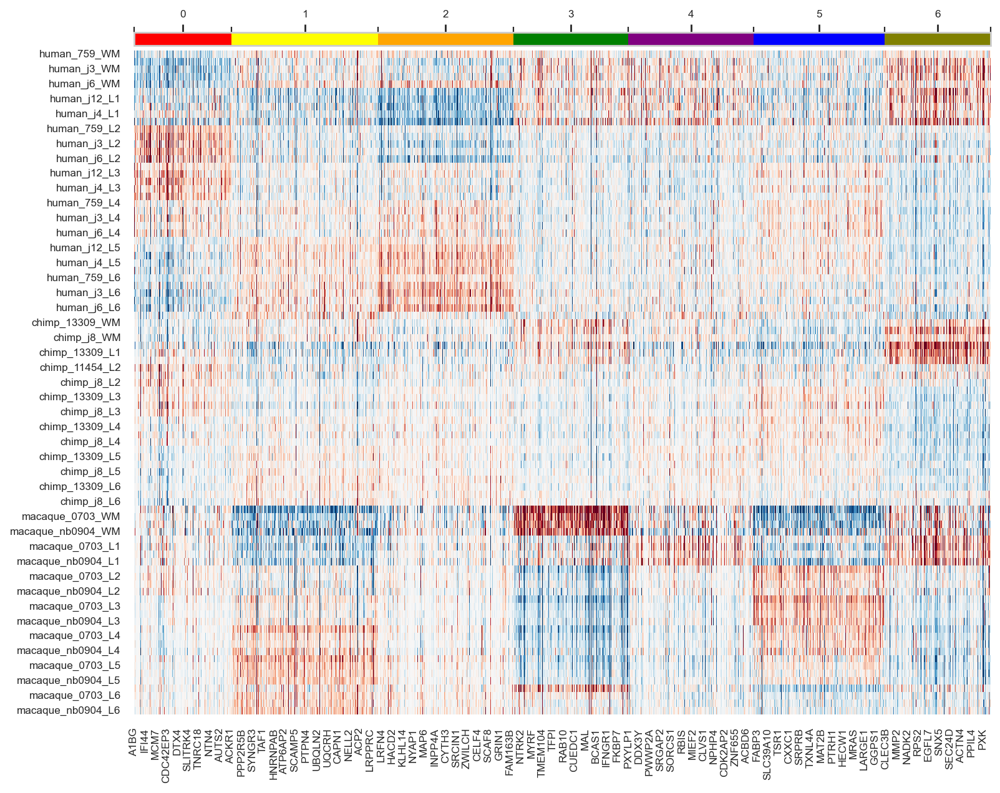

In [34]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

fig, ax = plt.subplots(figsize=(11, 9), dpi=80)
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0, cbar=False)
divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='2%', pad=0.05)
cmap = mpl.colors.ListedColormap(colors)

cluster_size = labels.value_counts().loc[clusters].values
cluster_pos = cluster_size.cumsum()
bounds = [0] + list(cluster_pos)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
fig.colorbar(
    mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
    cax=cax,
    ticks=bounds,
    orientation='horizontal',
    spacing='proportional'
)
cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
cax.xaxis.tick_top()

plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova.png')

### Heatmap for each layer

In [35]:
sc.settings.set_figure_params(dpi=80)
sns.set(font_scale=0.7)

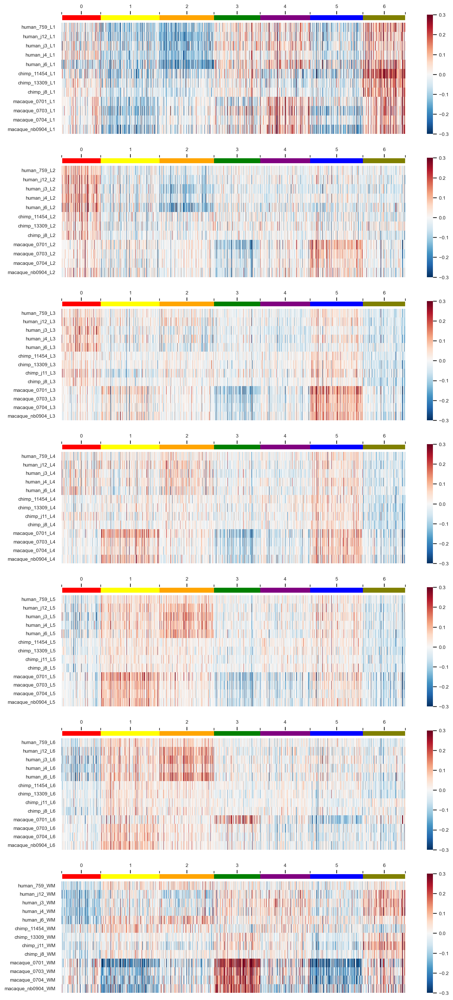

In [36]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(n_clusters, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), layers):
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order], ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top() 
plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova_sep_clusters.png')

### Snakeplot for each layer

In [37]:
df_annotation = df.copy()
df_annotation['layer'] = adata_norm_anova.obs.layer
df_annotation['condition'] = adata_norm_anova.obs.condition

In [38]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

A1BG      AACS     AADAT      AAK1     AARS1      AATK  \
condition layer                                                               
chimp     L1     0.000311 -0.067096  0.004136 -0.005820  0.015548 -0.030878   
          L2    -0.025557 -0.121551 -0.001924 -0.014660 -0.027253 -0.065565   
          L3     0.076603 -0.020433  0.028048 -0.007055 -0.005945 -0.000613   
          L4     0.062482  0.042894  0.007185 -0.018464 -0.009535  0.005079   
          L5    -0.010620  0.077460 -0.009728 -0.007488 -0.010588  0.047233   

                     ABAT     ABCA2     ABCA3     ABCA5  ...    ZNF771  \
condition layer                                          ...             
chimp     L1    -0.005831 -0.000803  0.002673 -0.069278  ...  0.103981   
          L2    -0.089762 -0.000803 -0.019373  0.024794  ... -0.042995   
          L3    -0.051850  0.003244 -0.005012  0.033964  ...  0.032819   
          L4     0.036816 -0.001952 -0.002816  0.011740  ... -0.024613   
          L5     0.086123 -0.001801 -0.002795 -0.010684  ... -0.023965   

                   ZNF791     ZNF92     ZNFX1     ZNRF3    ZSWIM5    ZSWIM6  \
condition layer                                                               
chimp     L1     0.060992  0.001364  0.044815  0.020308  0.015811  0.004193   
          L2    -0.006265  0.004805  0.007011 -0.019569 -0.002635 -0.006481   
          L3     0.006503 -0.001562 -0.014307 -0.014304 -0.002672 -0.001571   
          L4    -0.034777 -0.006946 -0.015902 -0.002362 -0.002672 -0.005166   
          L5    -0.015340 -0.008374 -0.023455 -0.019414 -0.000386 -0.001691   

                   ZWILCH    ZYG11B       ZYX  
condition layer                                
chimp     L1     0.002993 -0.007331  0.005605  
          L2     0.003258  0.005846 -0.003745  
          L3    -0.002625 -0.000610  0.003216  
          L4     0.004127  0.001754  0.003341  
          L5    -0.012560 -0.001946 -0.002624  

[5 rows x 4387 columns]

In [39]:
n_clusters

7

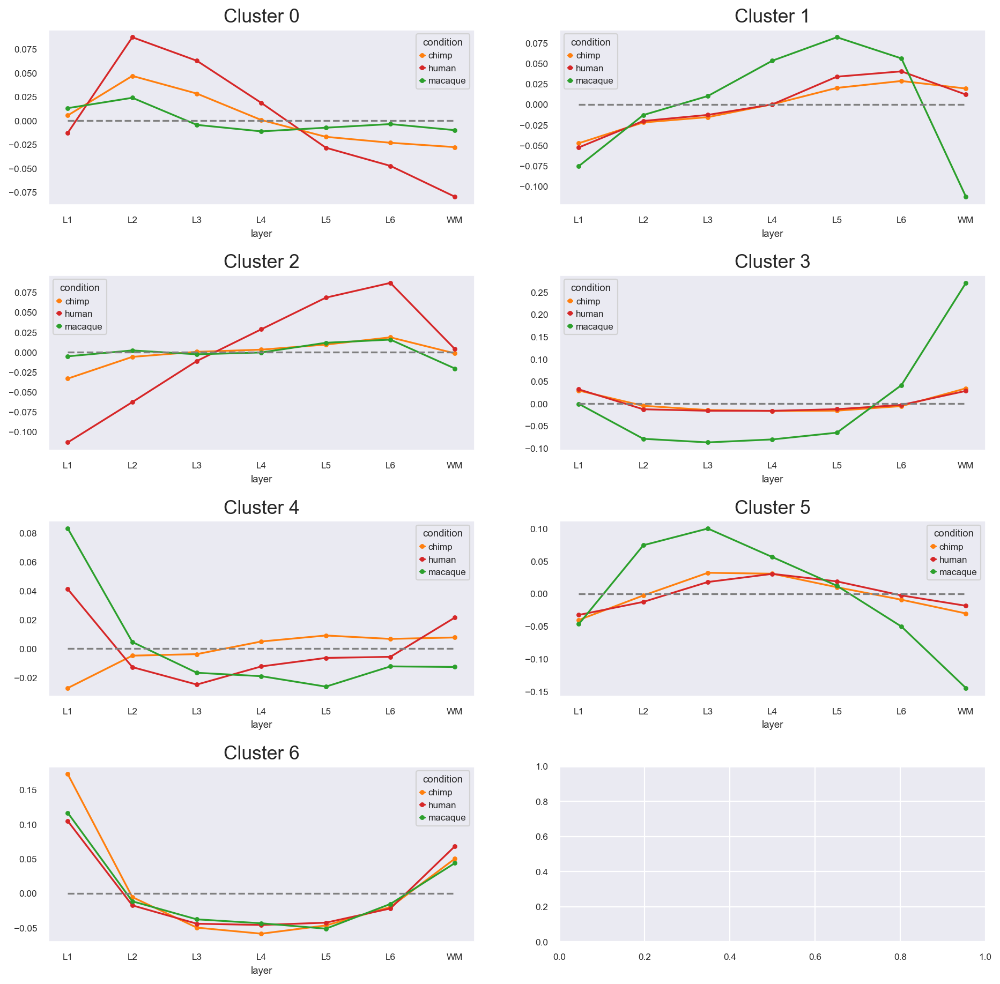

In [40]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * (n_clusters + 1) // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
    #plt.savefig(f'figures/snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.png', bbox_inches='tight')
    #plt.savefig(f'figures/snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.pdf', bbox_inches='tight')

### Z-scored Heatmap

In [41]:
df_zscored = (df - df.mean()) / df.std()

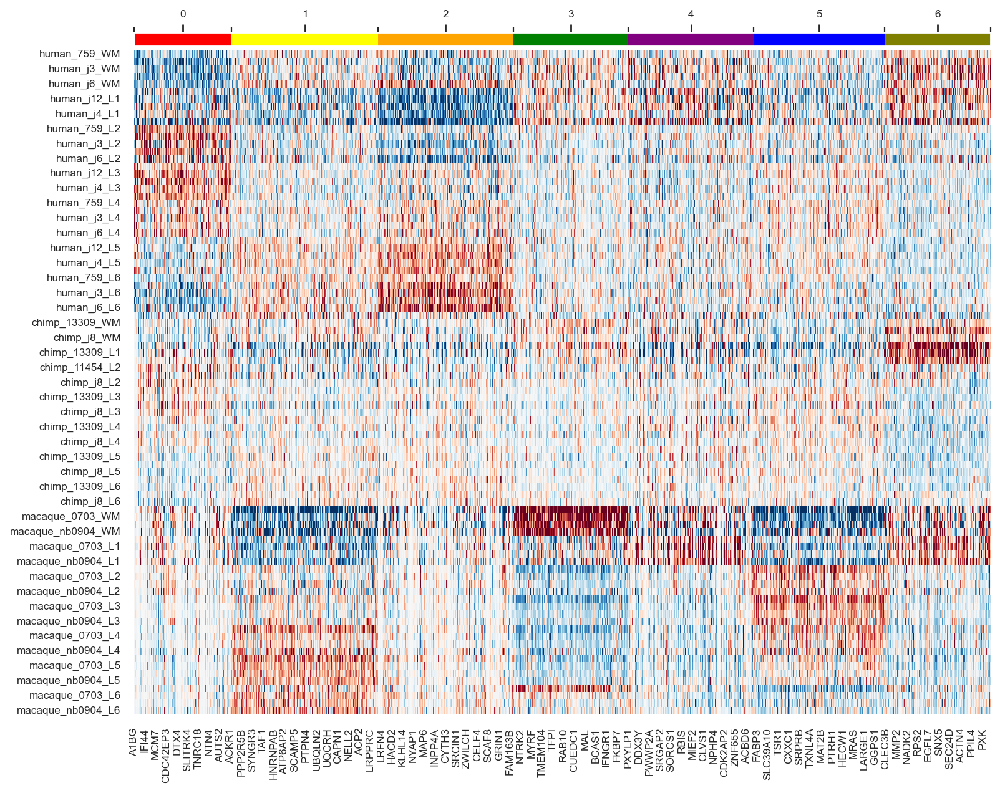

In [42]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

fig, ax = plt.subplots(figsize=(11, 9), dpi=80)
sns.heatmap(df_zscored.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0, cbar=False)
divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='2%', pad=0.05)
cmap = mpl.colors.ListedColormap(colors)

cluster_size = labels.value_counts().loc[clusters].values
cluster_pos = cluster_size.cumsum()
bounds = [0] + list(cluster_pos)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
fig.colorbar(
    mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
    cax=cax,
    ticks=bounds,
    orientation='horizontal',
    spacing='proportional'
)
cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
cax.xaxis.tick_top()

plt.savefig(f'figures/heatmaps/heatmap_spectr_zscored{n_clusters}_anova.png')

### T-test significant for human comparisons

In [43]:
genes_hs = ttest_res[(ttest_res.group1 == 'human') & (ttest_res.p_val_adj < 0.05)].gene.unique()
order_hs = order.intersection(genes_hs)
df_hs = df.loc[sample_order['all'], order_hs].copy()

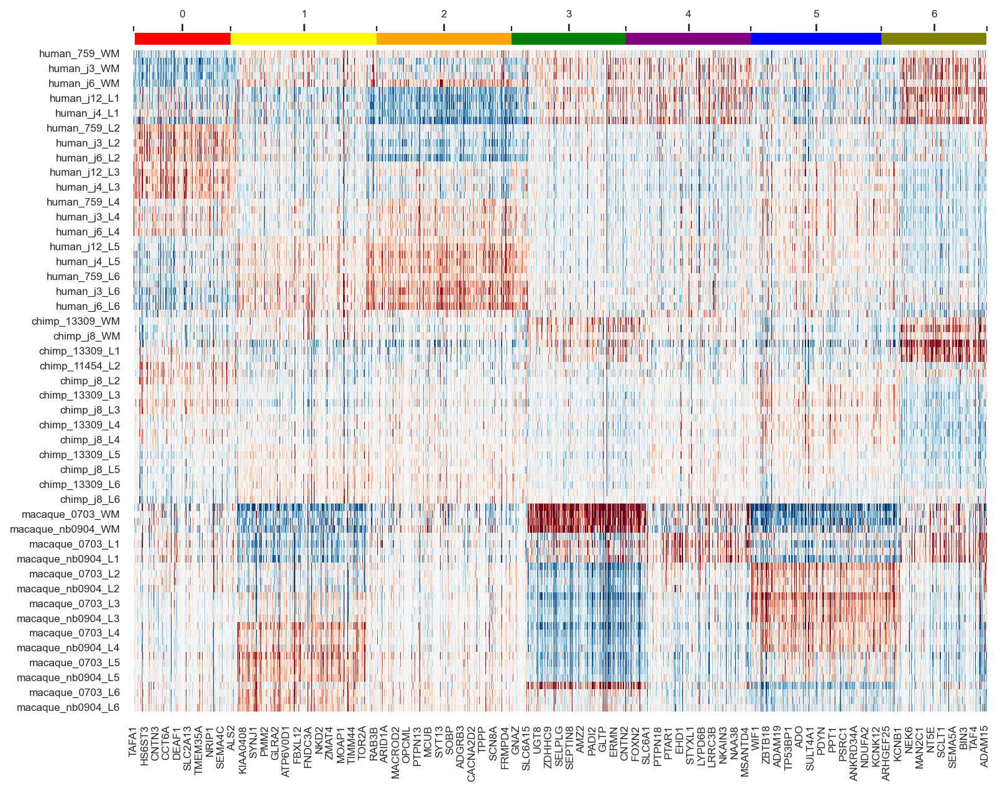

In [44]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

fig, ax = plt.subplots(figsize=(11, 9), dpi=80)
sns.heatmap(df_hs, ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0, cbar=False)
divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='2%', pad=0.05)
cmap = mpl.colors.ListedColormap(colors)

cluster_size = labels.value_counts().loc[clusters].values
cluster_pos = cluster_size.cumsum()
bounds = [0] + list(cluster_pos)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
fig.colorbar(
    mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
    cax=cax,
    ticks=bounds,
    orientation='horizontal',
    spacing='proportional'
)
cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
cax.xaxis.tick_top()

plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova_hs.png')

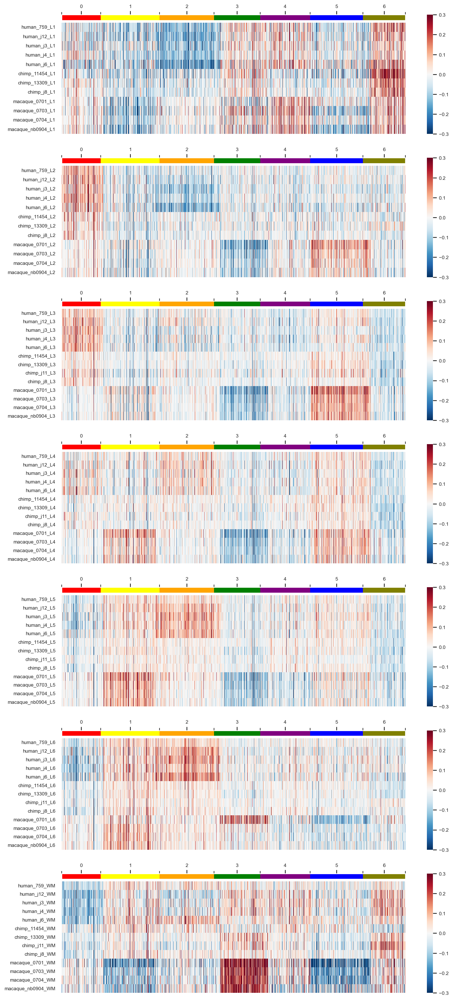

In [45]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(n_clusters, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), layers):
    df_layer = df_hs.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order_hs], ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top() 
plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova_hs_layers.png', bbox_inches='tight')
#plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova_hs_layers.pdf', bbox_inches='tight')

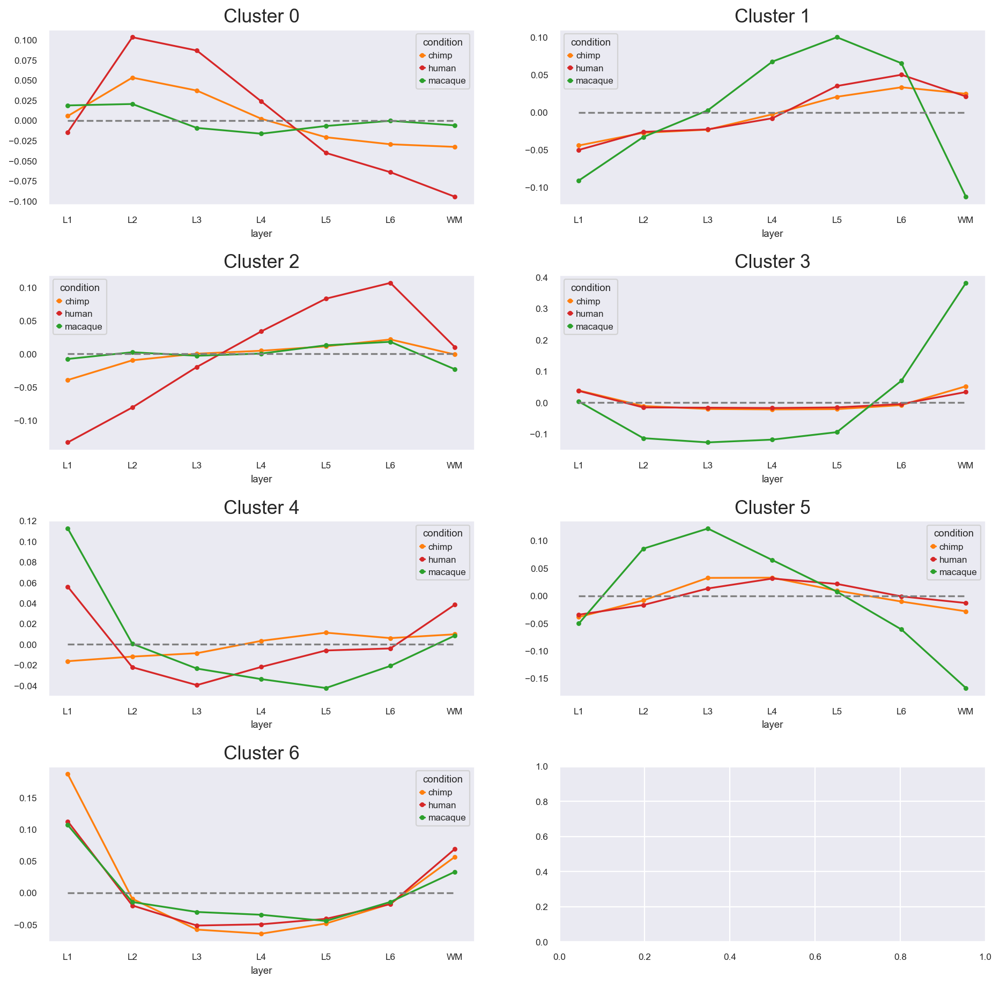

In [46]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * (n_clusters + 1)// 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels.loc[order_hs][labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
    #plt.savefig(f'figures/snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.png', bbox_inches='tight')
    #plt.savefig(f'figures/snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.pdf', bbox_inches='tight')

### Snakeplot

In [47]:
df_hs.head()

,TAFA1,IMMP1L,ING4,ITPR1,JPH3,JUP,KCND2,KCNH5,KCNJ6,KCNK2,...,HINT2,PYGM,RAMP2,RAMP1,HNRNPA3,DCXR,HPCAL1,ADAM15,HSPB6,RPS13
human_759_WM,-0.216101,-0.062380,0.025219,-0.043038,-0.073244,0.014023,-0.236702,-0.160811,-0.060554,-0.004517,...,-0.061833,-0.030226,-0.137906,0.011960,-0.064695,0.033108,0.197917,-0.003354,0.001741,-0.027321
human_j12_WM,-0.248537,-0.070003,-0.013088,-0.116205,-0.142311,-0.190251,-0.091934,-0.155394,-0.027374,-0.025187,...,0.020663,0.022742,0.054035,0.143502,-0.051758,0.086032,0.020816,0.067045,0.055861,-0.022724
human_j3_WM,-0.025276,-0.073431,-0.097064,-0.057593,-0.125508,-0.215206,-0.041480,-0.052342,0.015379,-0.001267,...,0.006395,0.016074,0.004850,0.114558,0.106128,0.196068,-0.103140,-0.001461,0.052618,-0.031708
human_j4_WM,-0.173838,-0.080836,-0.076898,-0.112014,-0.093599,-0.183606,-0.039499,-0.051182,-0.005624,-0.023760,...,-0.004957,-0.006128,0.074650,0.316182,-0.031483,0.095792,-0.025737,-0.047657,0.016550,0.172424
human_j6_WM,-0.258520,-0.063206,-0.114009,-0.113416,-0.118531,-0.038369,-0.131394,-0.127737,0.046269,-0.112509,...,0.030479,-0.011938,-0.049056,0.002205,0.026373,0.070357,0.023597,0.052868,-0.001807,-0.157946


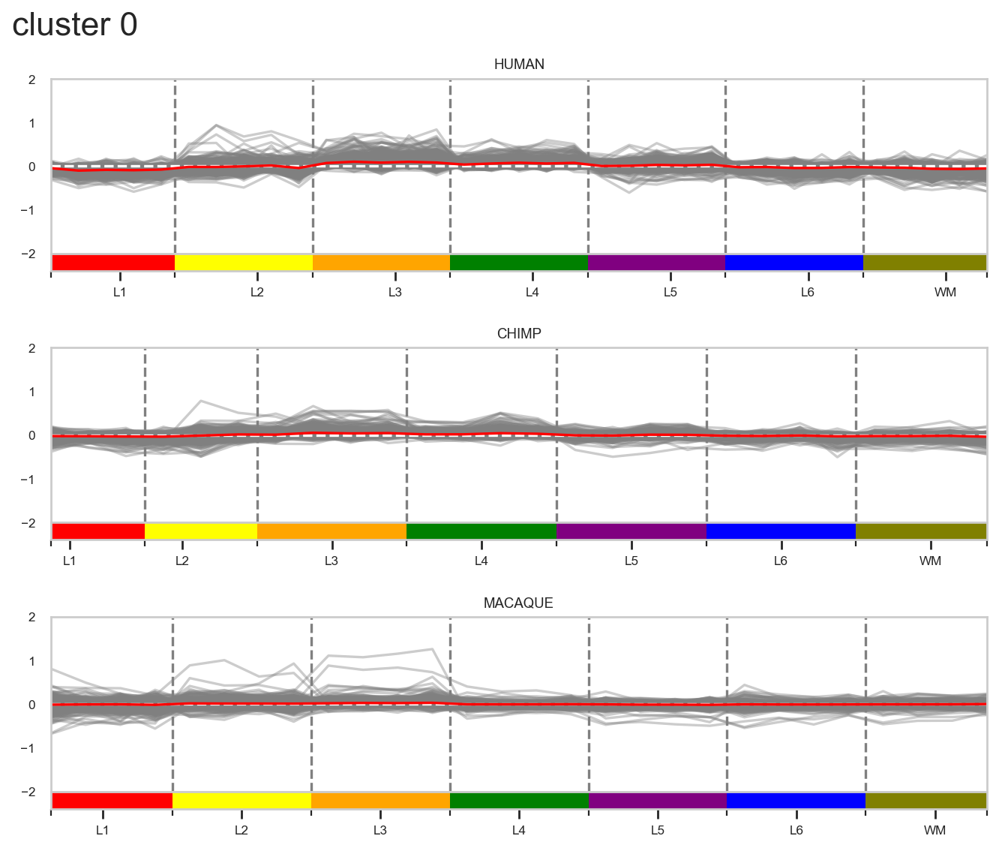

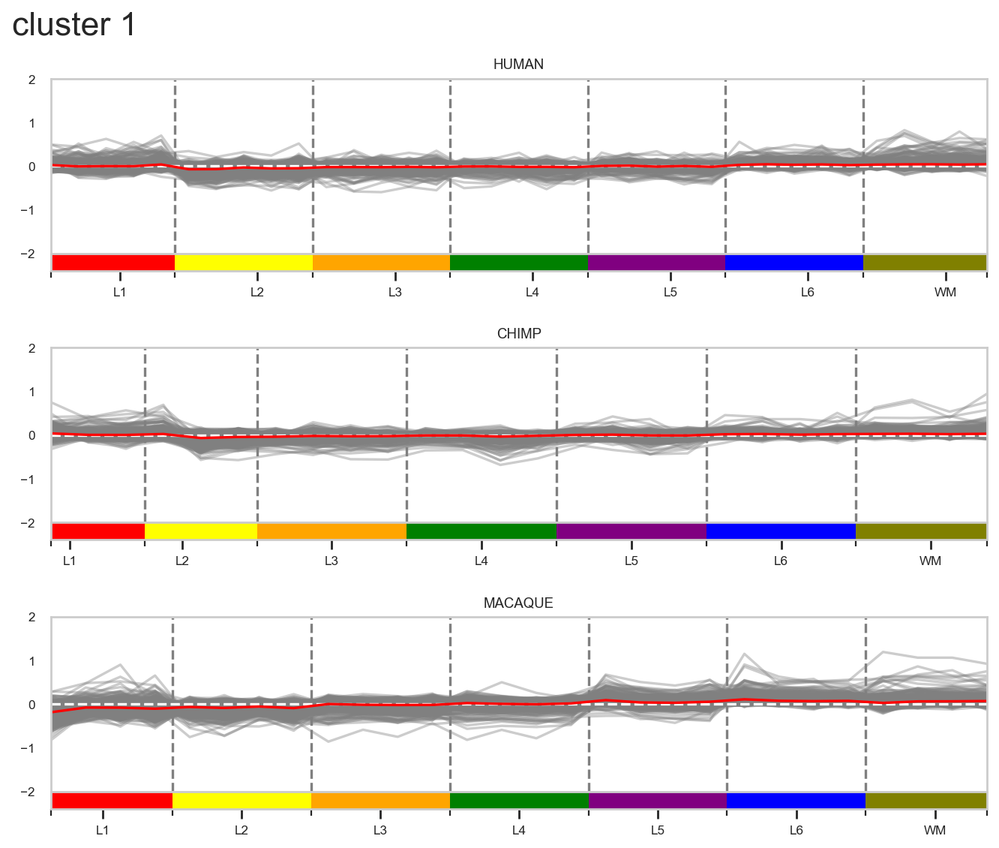

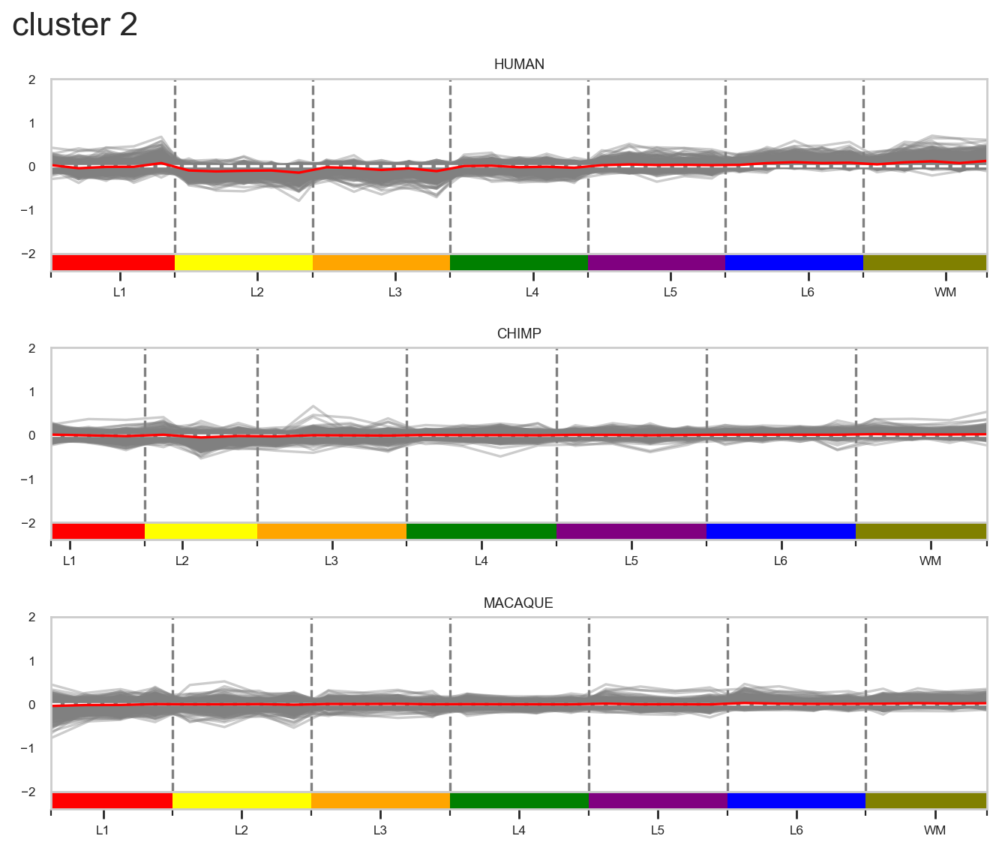

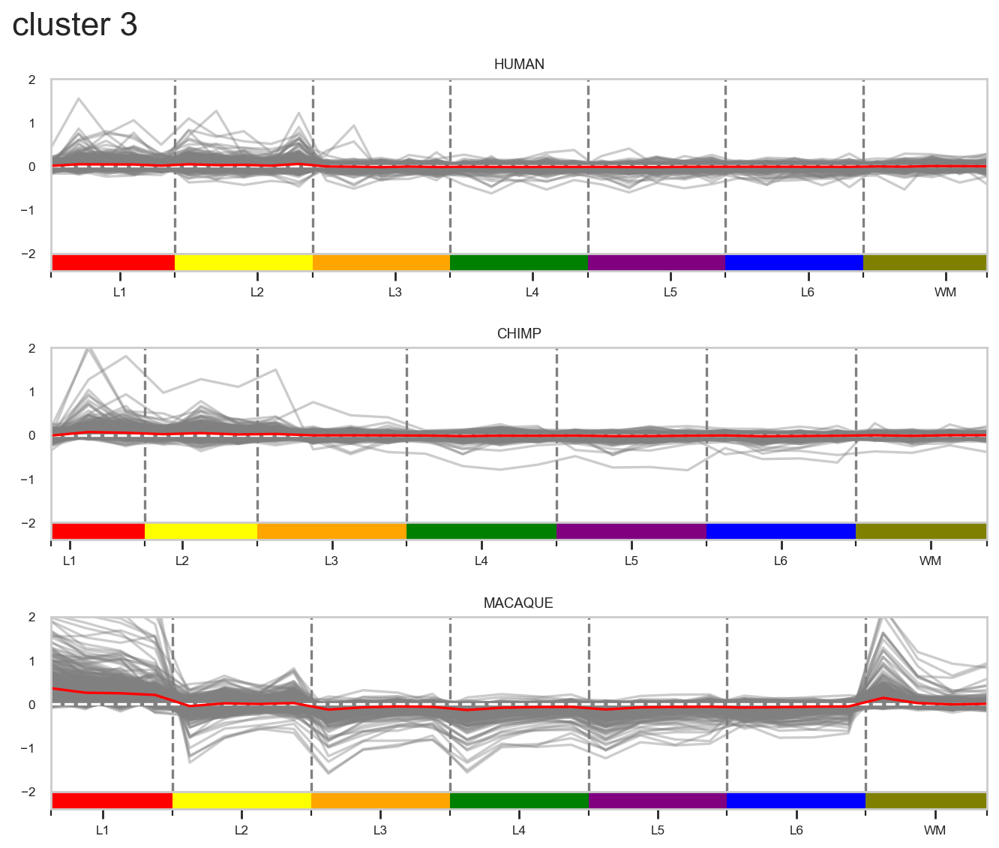

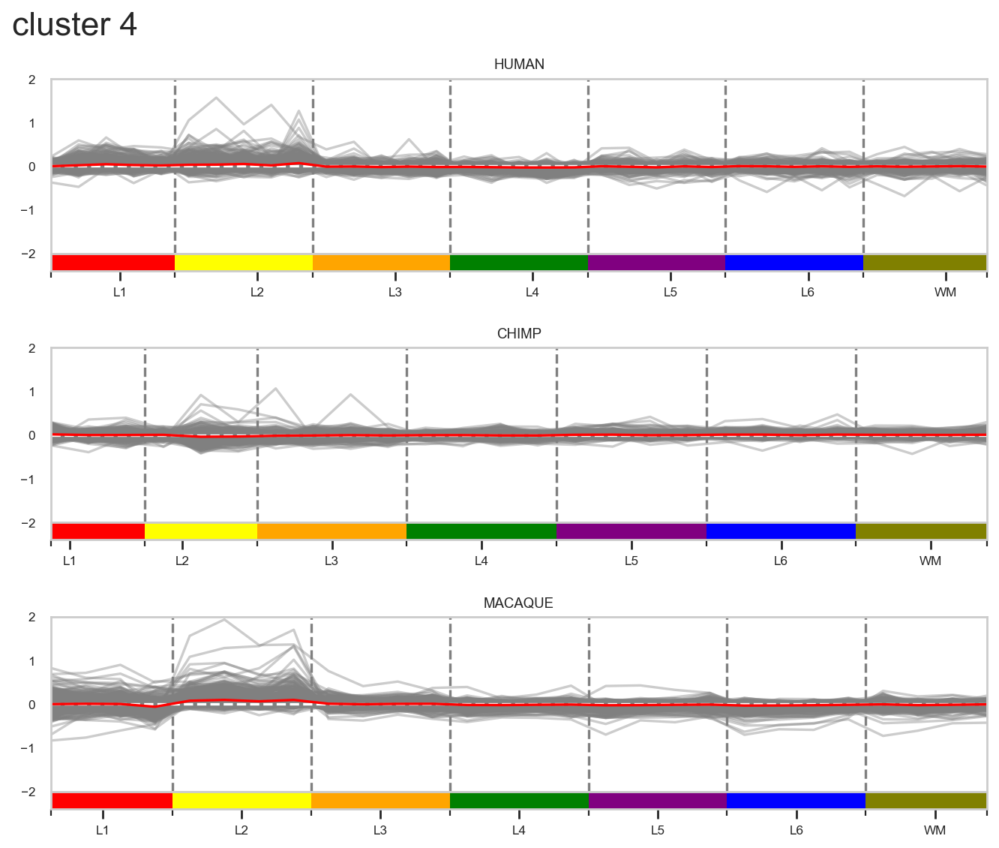

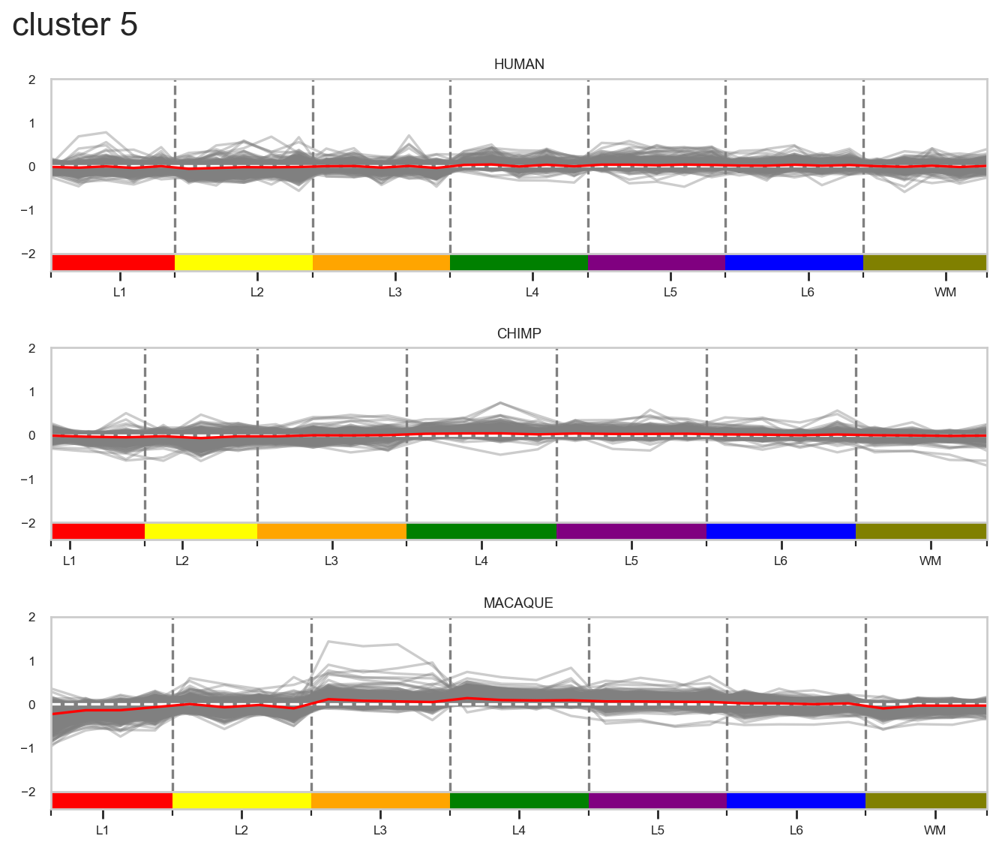

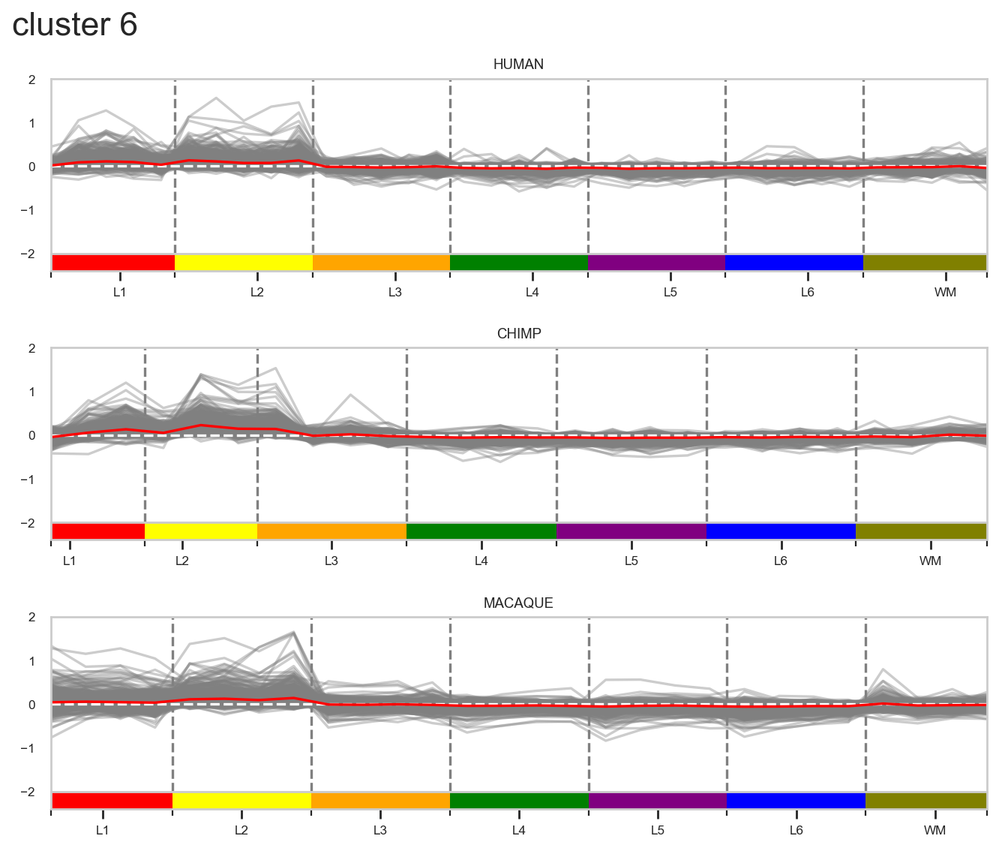

In [48]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker
sns.set_style("whitegrid")

clusters = np.arange(n_clusters)
colors = cluster_color[:7]

for label in clusters:
    genes = labels[labels == label].index.tolist()

    fig, axes = plt.subplots(3, 1, figsize=(10, 8), gridspec_kw={'hspace': 0.4})
    fig.suptitle(f'cluster {label}', fontsize=20, x=0.2)

    for ax, cond in zip(axes, ['human', 'chimp', 'macaque']):
        # subset df
        df_snake = df.loc[sample_order[cond], genes]
        # count number of samples for each layer
        lines = [sum(map(lambda x: layer in x, sample_order[cond])) for layer in layers]
        # position for layer boarders
        layer_pos = np.cumsum(lines) - 1
        # min and max values
        ymin, ymax = -2, 2
        # sample mean
        sample_mean = df_snake.mean(axis=1)
        # ploting
        ax.plot(np.arange(len(sample_mean)), df_snake, '-', color='grey', alpha=0.4)
        ax.vlines(layer_pos + 0.5, ymin=ymin, ymax=ymax, colors='grey', linestyles='dashed')
        ax.hlines(0, xmin=0, xmax=len(sample_mean) - 1, colors='white', linestyles='dashed')
        ax.plot(np.arange(len(sample_mean)), sample_mean, 'red')
        # customize
        ax.grid(False)
        ax.xaxis.set_major_locator(ticker.NullLocator())
        ax.set_title(cond.upper())
        ax.set_xlim(0, len(sample_mean) - 1)
        ax.set_ylim(ymin, ymax)
        # create colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes('bottom', size='10%', pad=0)
        cmap = mpl.colors.ListedColormap(colors)

        bounds = [0] + list(layer_pos + 0.5)
        bounds[-1] = bounds[-1] - 0.5
        norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
        fig.colorbar(
            mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
            cax=cax,
            ticks=bounds,
            orientation='horizontal',
            spacing='proportional'
        )
        cax.xaxis.set_major_locator(ticker.FixedLocator(layer_pos - 1.5))
        cax.xaxis.set_major_formatter(ticker.FixedFormatter(layers))
    plt.savefig(f'figures/snakeplots/snakeplot_samples_cluster{n_clusters}_{label}.png', bbox_inches='tight')
    #plt.savefig(f'figures/snakeplots/snakeplot_samples_cluster{n_clusters}_{label}.pdf', bbox_inches='tight')

In [49]:
df_annotatin = df.copy()
df_annotatin['layer'] = adata_norm_anova.obs.layer
df_annotatin['condition'] = adata_norm_anova.obs.condition
df_annotatin.head()

,A1BG,AACS,AADAT,AAK1,AARS1,AATK,ABAT,ABCA2,ABCA3,ABCA5,...,ZNF92,ZNFX1,ZNRF3,ZSWIM5,ZSWIM6,ZWILCH,ZYG11B,ZYX,layer,condition
human_759_WM,-0.065495,0.041268,-0.054351,-0.072019,0.007453,-0.036537,-0.003708,0.000981,0.004642,-0.147044,...,-0.019168,0.002537,-0.044088,0.036042,-0.025797,0.041762,-0.026634,-0.087689,WM,human
human_j12_WM,-0.060239,0.025153,-0.066483,0.001885,0.064853,0.019544,0.007084,-0.026349,0.017147,-0.132685,...,-0.102125,0.029141,0.036802,0.008039,-0.011982,-0.051615,-0.144635,-0.030077,WM,human
human_j3_WM,-0.095841,-0.028083,-0.100378,0.121080,-0.017252,-0.081690,0.053134,0.033085,-0.055234,-0.048987,...,-0.034854,0.026583,0.131115,-0.025040,0.025672,-0.082378,-0.050937,-0.060124,WM,human
human_j4_WM,-0.091943,-0.020194,-0.100982,0.040012,0.055494,-0.047963,0.159400,0.006362,0.026030,0.014880,...,-0.011414,0.055548,0.012012,-0.031159,-0.014967,-0.117408,-0.020468,-0.110733,WM,human
human_j6_WM,-0.078252,0.004524,-0.134850,0.078731,-0.074468,0.007142,0.013736,-0.082062,0.098298,0.041546,...,0.024004,-0.049726,-0.023704,0.052648,-0.099636,-0.005066,0.020878,-0.112694,WM,human


In [50]:
layer_mean = df_annotatin.groupby(['condition', 'layer']).mean()
layer_mean.head()

A1BG      AACS     AADAT      AAK1     AARS1      AATK  \
condition layer                                                               
chimp     L1     0.000311 -0.067096  0.004136 -0.005820  0.015548 -0.030878   
          L2    -0.025557 -0.121551 -0.001924 -0.014660 -0.027253 -0.065565   
          L3     0.076603 -0.020433  0.028048 -0.007055 -0.005945 -0.000613   
          L4     0.062482  0.042894  0.007185 -0.018464 -0.009535  0.005079   
          L5    -0.010620  0.077460 -0.009728 -0.007488 -0.010588  0.047233   

                     ABAT     ABCA2     ABCA3     ABCA5  ...    ZNF771  \
condition layer                                          ...             
chimp     L1    -0.005831 -0.000803  0.002673 -0.069278  ...  0.103981   
          L2    -0.089762 -0.000803 -0.019373  0.024794  ... -0.042995   
          L3    -0.051850  0.003244 -0.005012  0.033964  ...  0.032819   
          L4     0.036816 -0.001952 -0.002816  0.011740  ... -0.024613   
          L5     0.086123 -0.001801 -0.002795 -0.010684  ... -0.023965   

                   ZNF791     ZNF92     ZNFX1     ZNRF3    ZSWIM5    ZSWIM6  \
condition layer                                                               
chimp     L1     0.060992  0.001364  0.044815  0.020308  0.015811  0.004193   
          L2    -0.006265  0.004805  0.007011 -0.019569 -0.002635 -0.006481   
          L3     0.006503 -0.001562 -0.014307 -0.014304 -0.002672 -0.001571   
          L4    -0.034777 -0.006946 -0.015902 -0.002362 -0.002672 -0.005166   
          L5    -0.015340 -0.008374 -0.023455 -0.019414 -0.000386 -0.001691   

                   ZWILCH    ZYG11B       ZYX  
condition layer                                
chimp     L1     0.002993 -0.007331  0.005605  
          L2     0.003258  0.005846 -0.003745  
          L3    -0.002625 -0.000610  0.003216  
          L4     0.004127  0.001754  0.003341  
          L5    -0.012560 -0.001946 -0.002624  

[5 rows x 4387 columns]

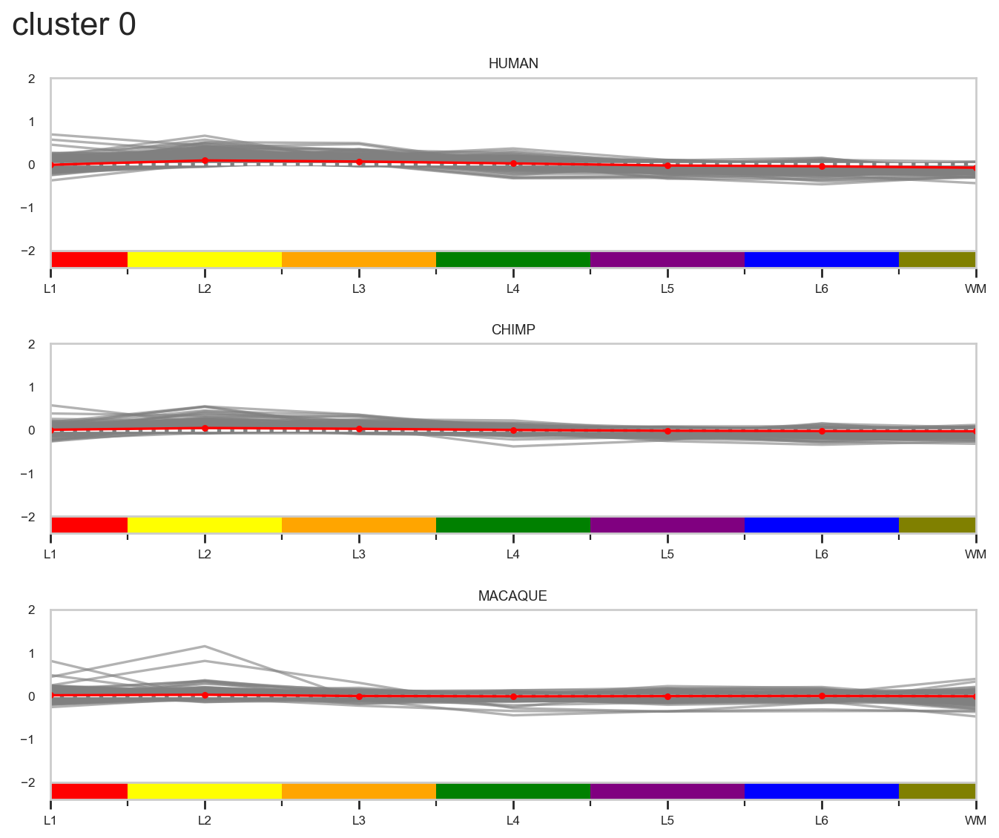

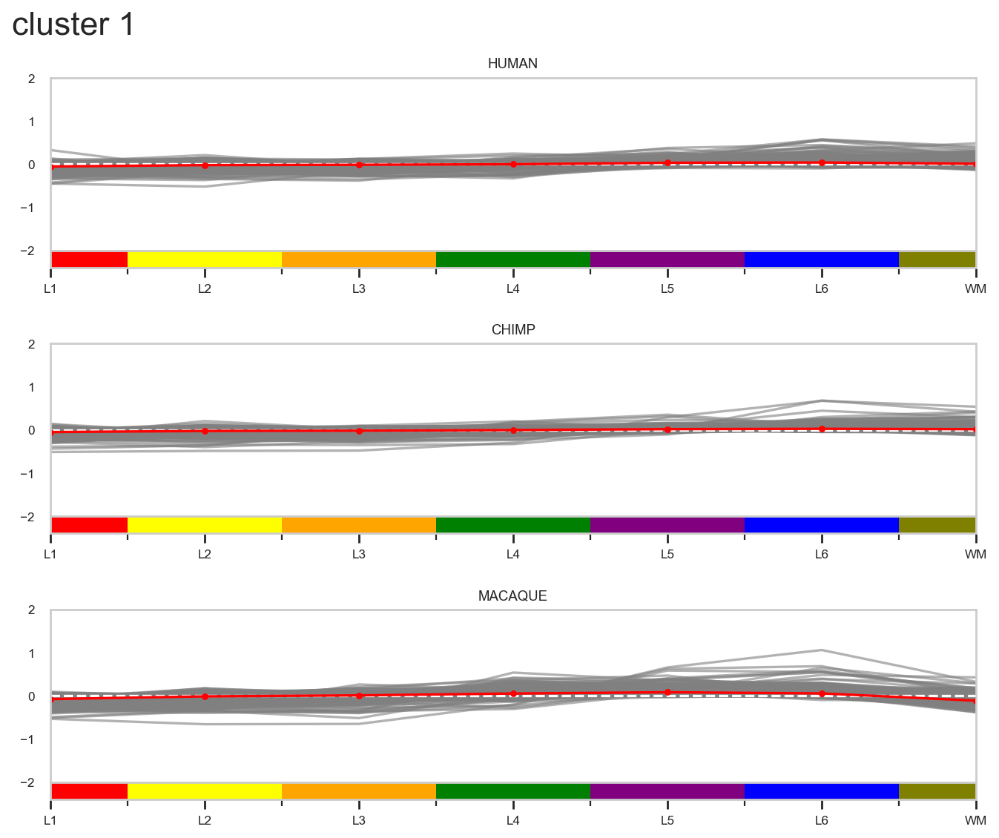

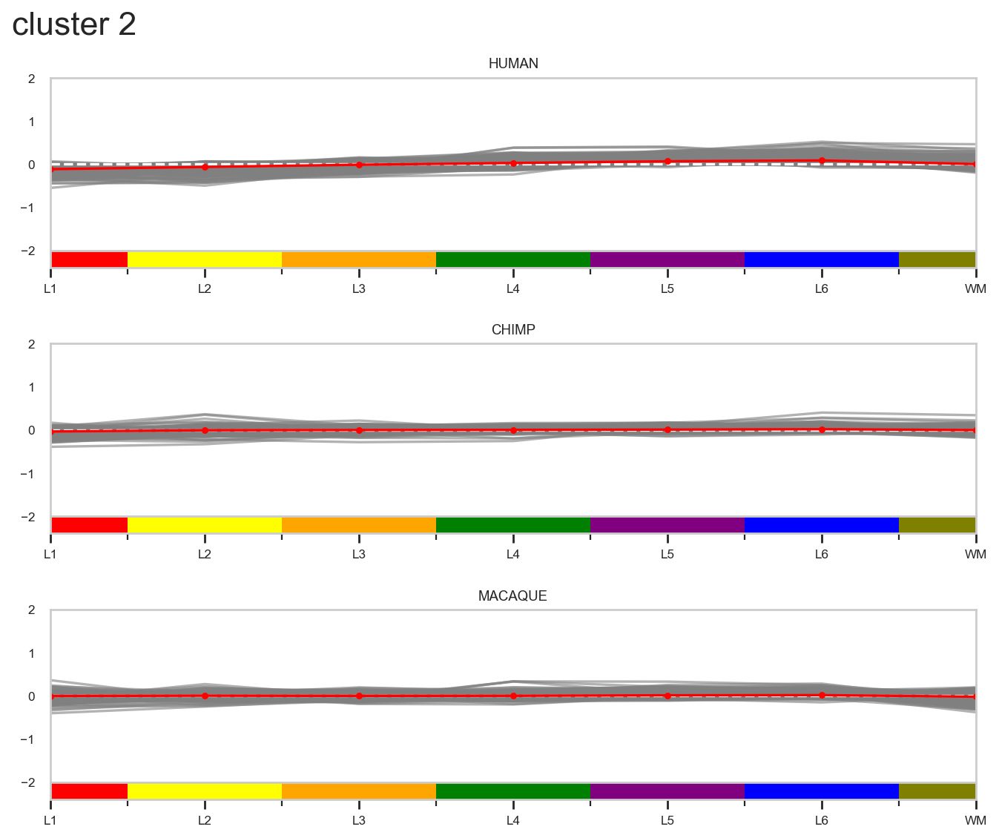

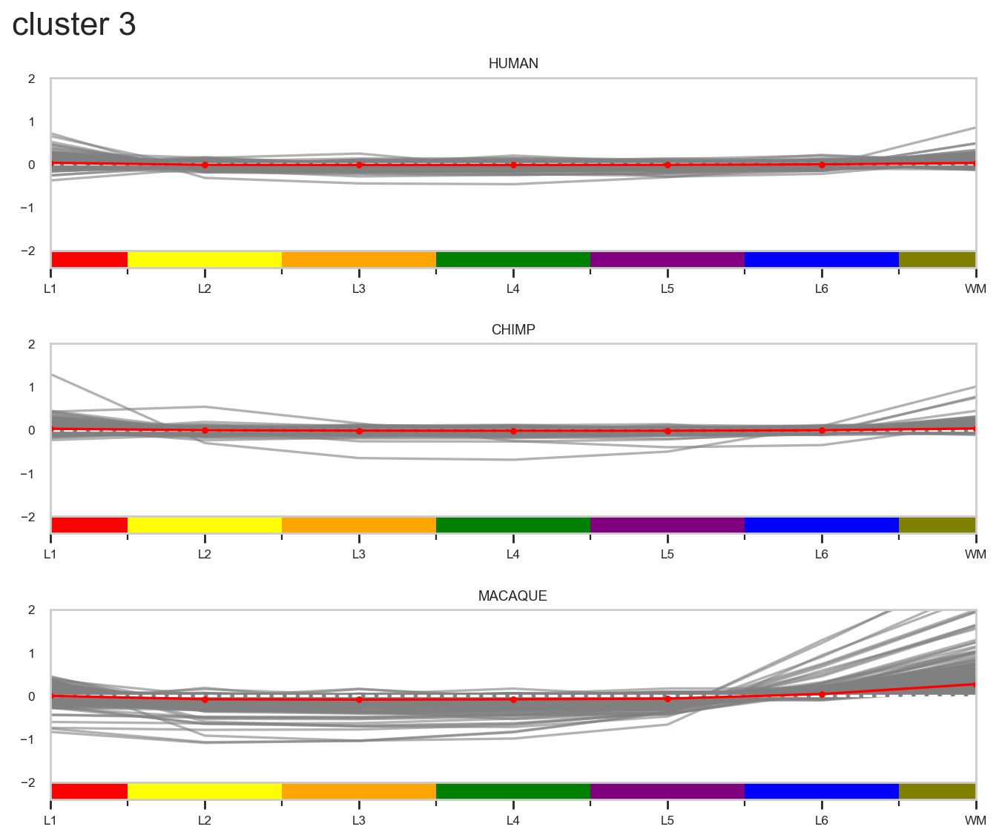

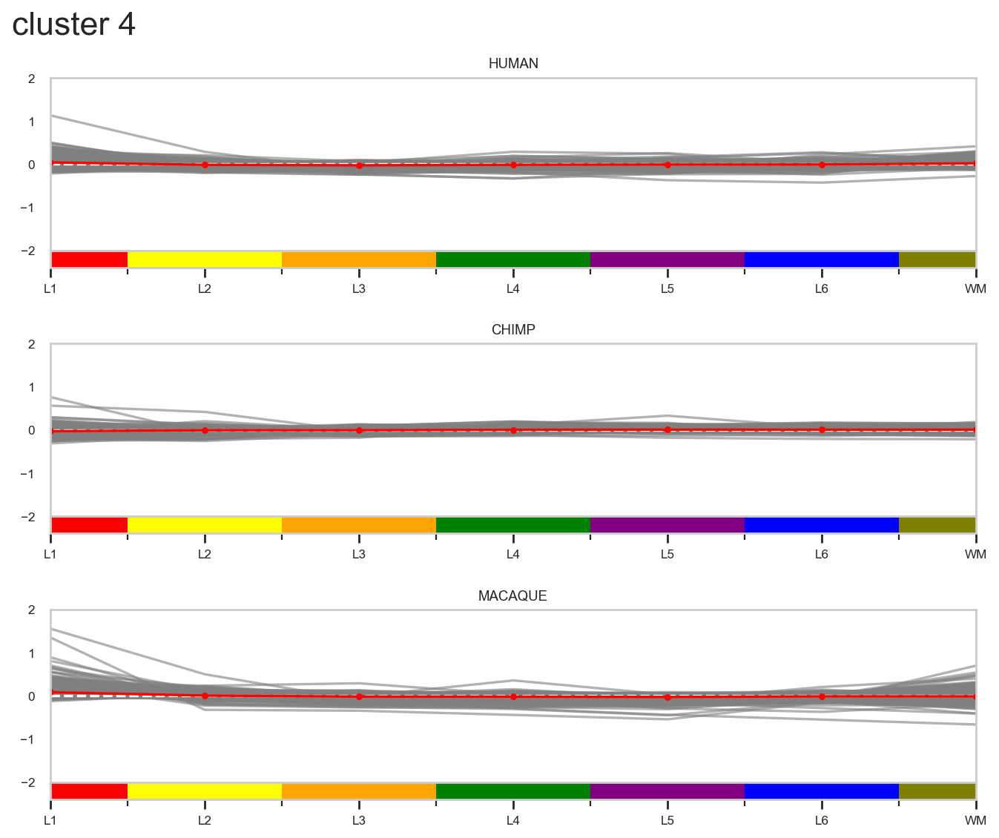

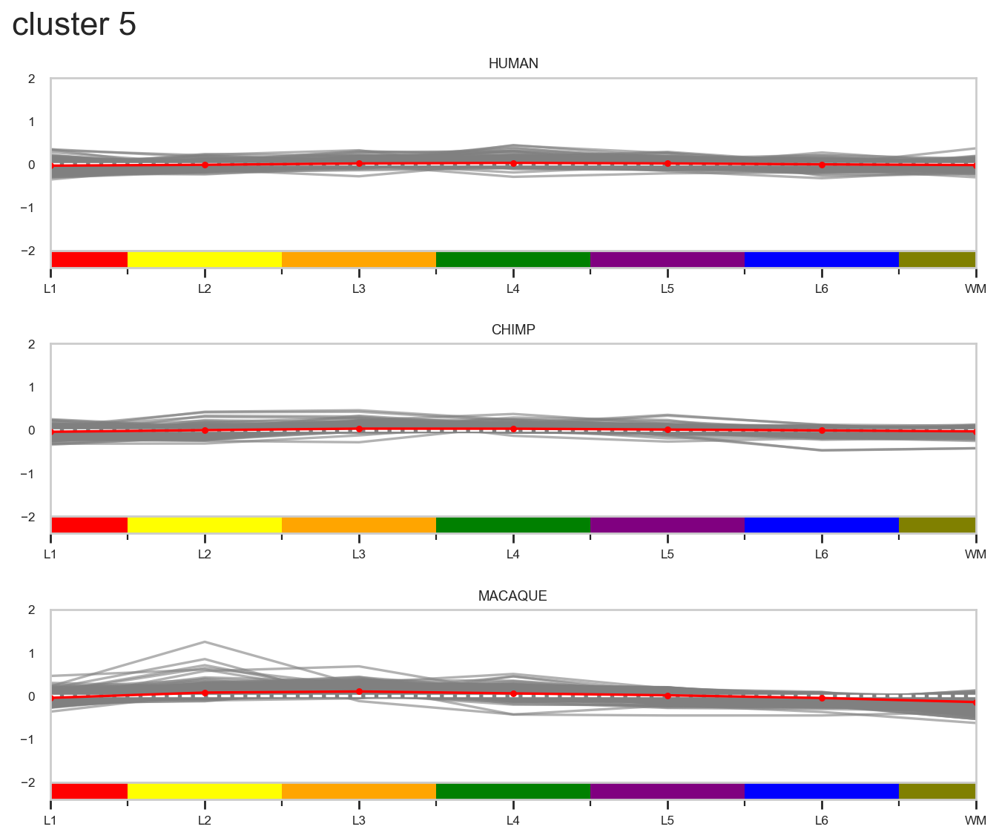

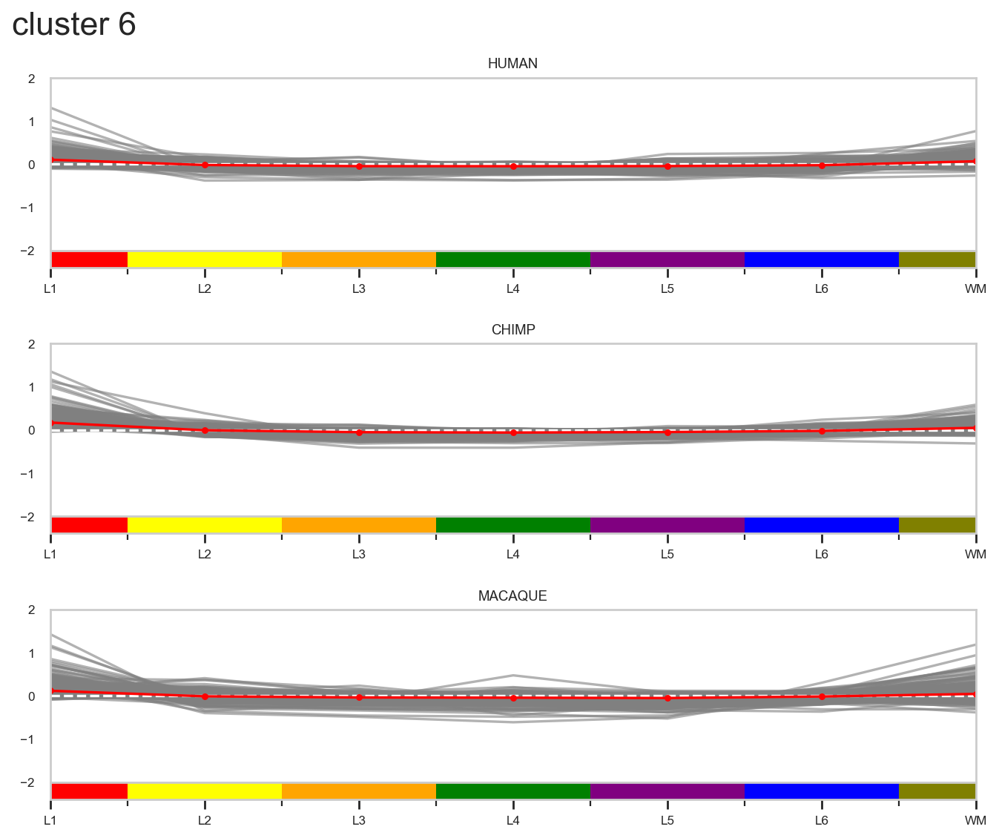

In [51]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

clusters = np.arange(n_clusters)
colors = cluster_color[:7]

for label in clusters:
    genes = labels[labels == label].index.tolist()

    fig, axes = plt.subplots(3, 1, figsize=(10, 8), gridspec_kw={'hspace': 0.4})
    fig.suptitle(f'cluster {label}', fontsize=20, x=0.2)

    for ax, cond in zip(axes, ['human', 'chimp', 'macaque']):
        # subset df
        df_snake = layer_mean.loc[cond, genes].loc[layers]
        # position for layers
        layer_pos = np.arange(7)
        # min and max values
        ymin, ymax = -2, 2
        # sample mean
        sample_mean = df_snake.mean(axis=1)
        # ploting
        ax.plot(layer_pos, df_snake, '-', color='grey', alpha=0.6)
        ax.hlines(0, xmin=0, xmax=6, colors='white', linestyles='dashed')
        ax.plot(layer_pos, sample_mean, '.-', color='red')
        # customize
        ax.grid(False)
        ax.xaxis.set_major_locator(ticker.NullLocator())
        ax.set_title(cond.upper())
        ax.set_xlim(0, 6)
        ax.set_ylim(ymin, ymax)
        # create colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes('bottom', size='10%', pad=0)
        cmap = mpl.colors.ListedColormap(colors)

        bounds = [0] + list(layer_pos + 0.5)
        bounds[-1] = bounds[-1] - 0.5
        norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
        fig.colorbar(
            mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
            cax=cax,
            ticks=bounds,
            orientation='horizontal',
            spacing='proportional'
        )
        cax.xaxis.set_major_locator(ticker.FixedLocator(layer_pos))
        cax.xaxis.set_major_formatter(ticker.FixedFormatter(layers))
    plt.savefig(f'figures/snakeplots/snakeplot_layers_cluster{n_clusters}_{label}.png', bbox_inches='tight')
    #plt.savefig(f'figures/snakeplots/snakeplot_layers_cluster{label}.pdf', bbox_inches='tight')

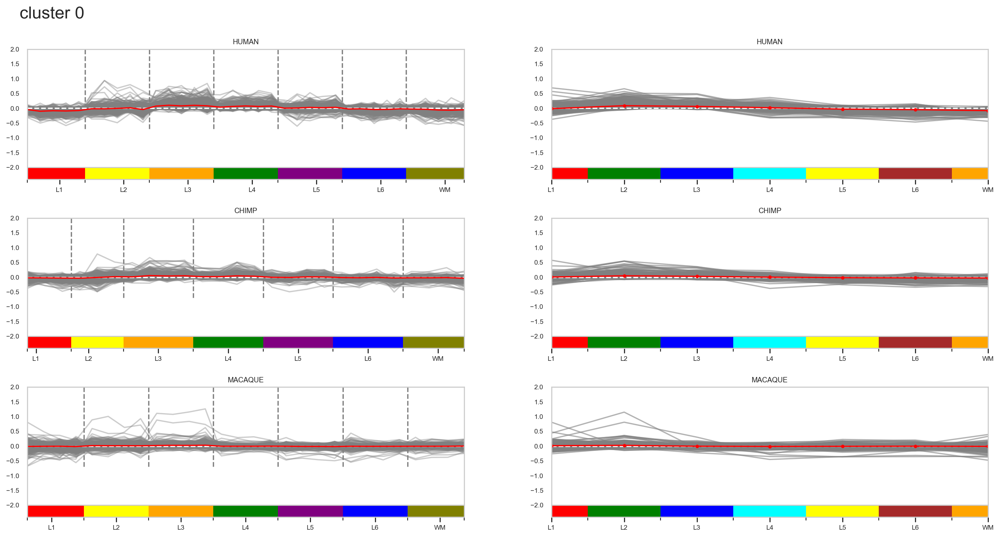

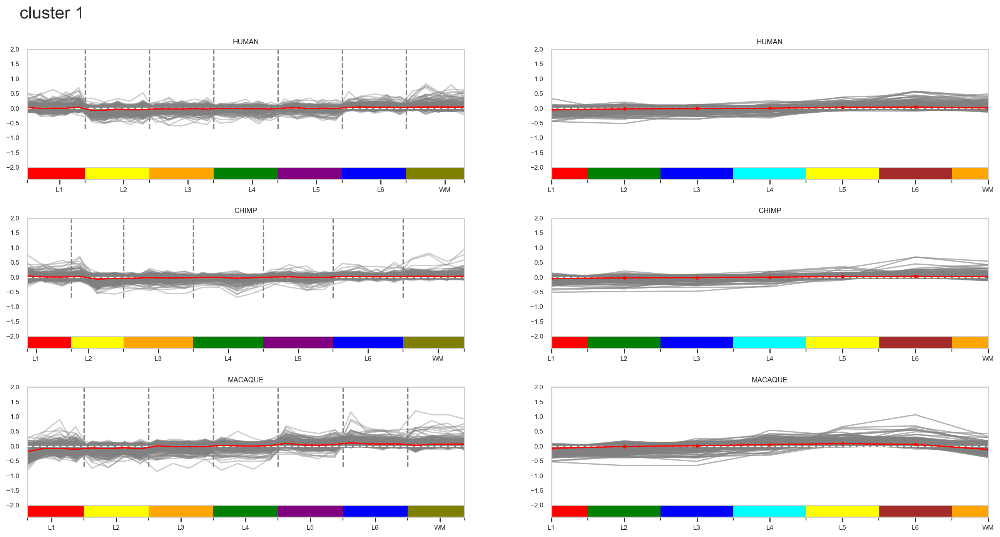

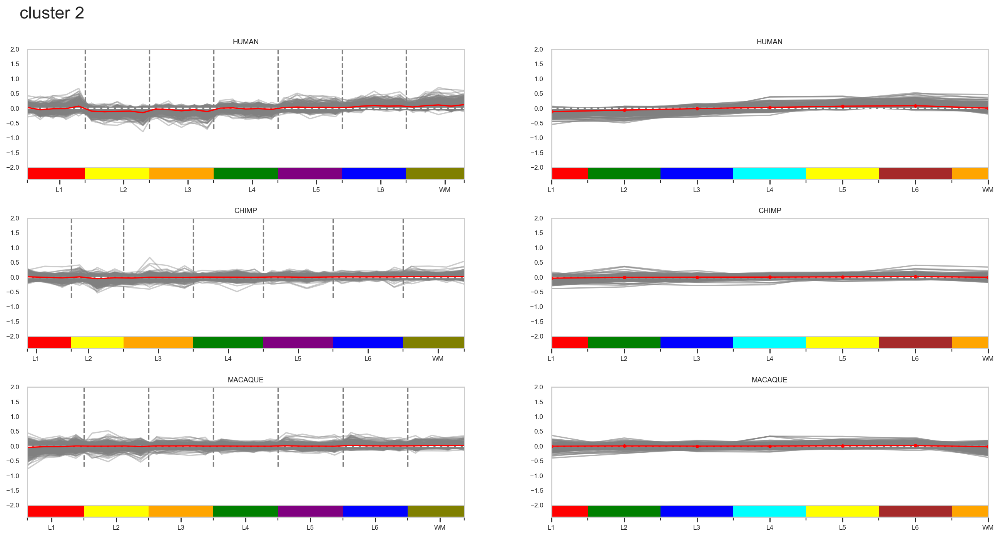

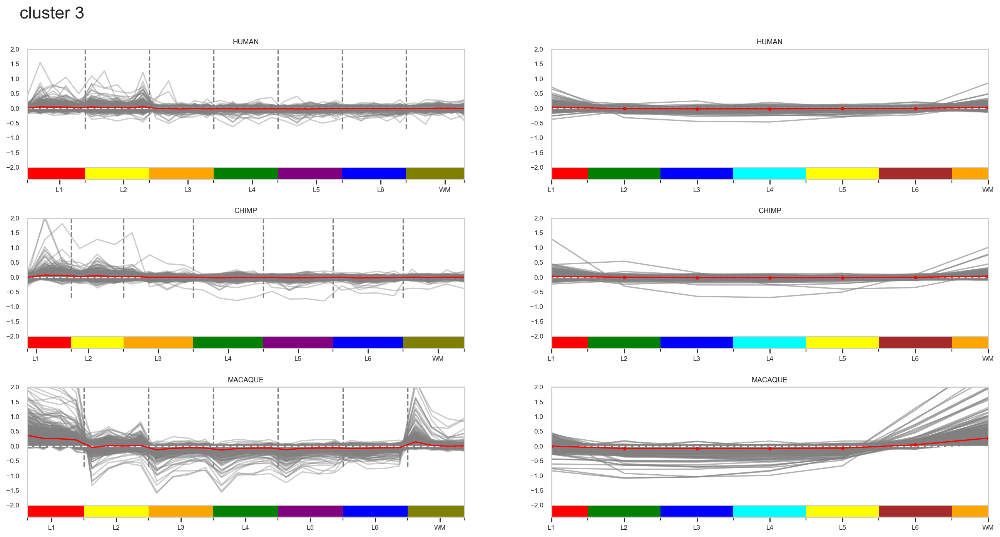

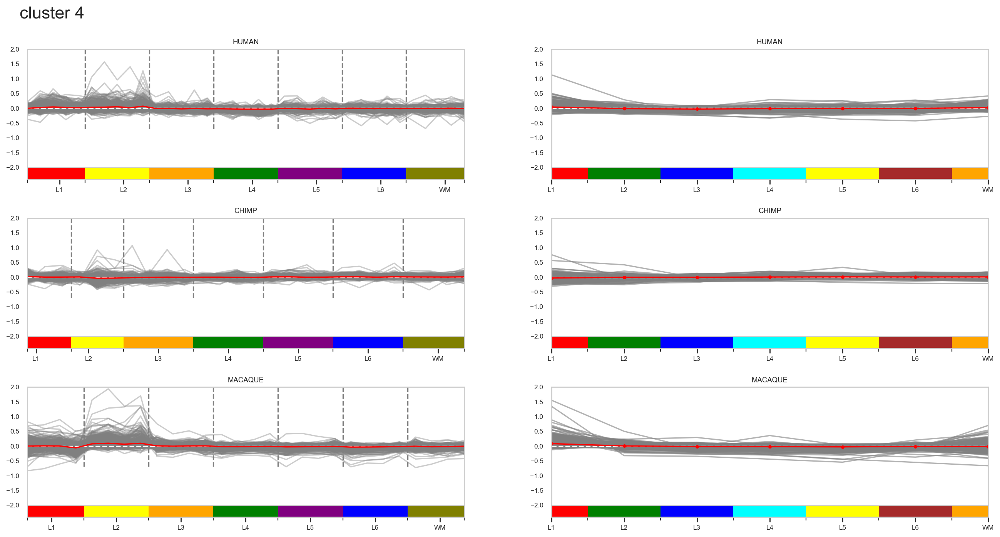

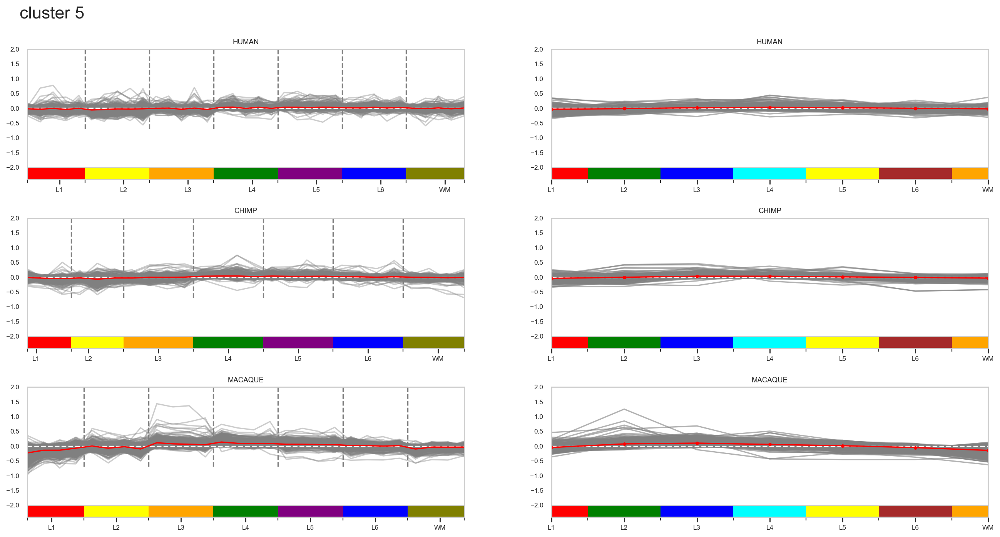

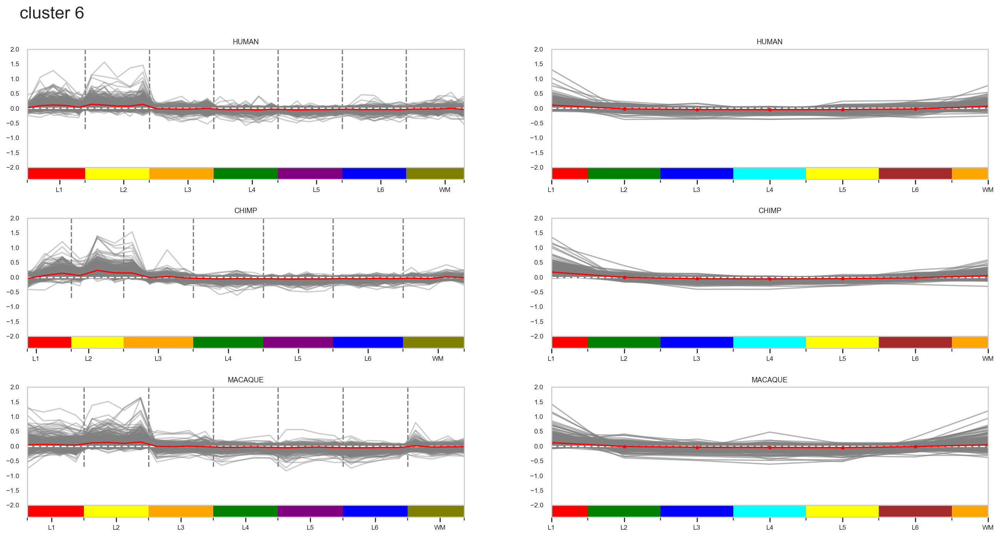

In [52]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:7]

for label in clusters:
    genes = labels[labels == label].index.tolist()

    fig, axes = plt.subplots(3, 2, figsize=(20, 10), gridspec_kw={'hspace': 0.3})
    fig.suptitle(f'cluster {label}', fontsize=20, x=0.2)

    for ax, cond in zip(axes[:, 0], ['human', 'chimp', 'macaque']):
        # subset df
        df_snake = df.loc[sample_order[cond], genes]
        # count number of samples for each layer
        lines = [sum(map(lambda x: layer in x, sample_order[cond])) for layer in layers]
        # position for layer boarders
        layer_pos = np.cumsum(lines) - 1
        # min and max values
        ymin, ymax = -2, 2
        # sample mean
        sample_mean = df_snake.mean(axis=1)
        # ploting
        ax.plot(np.arange(len(sample_mean)), df_snake, '-', color='grey', alpha=0.4)
        ax.vlines(layer_pos + 0.5, ymin=-0.7, ymax=ymax, colors='grey', linestyles='dashed')
        ax.hlines(0, xmin=0, xmax=len(sample_mean) - 1, colors='white', linestyles='dashed')
        ax.plot(np.arange(len(sample_mean)), sample_mean, 'red')
        # customize
        ax.grid(False)
        ax.xaxis.set_major_locator(ticker.NullLocator())
        ax.set_title(cond.upper())
        ax.set_xlim(0, len(sample_mean) - 1)
        ax.set_ylim(ymin, ymax)
        # create colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes('bottom', size='10%', pad=0)
        cmap = mpl.colors.ListedColormap(colors)

        bounds = [0] + list(layer_pos + 0.5)
        bounds[-1] = bounds[-1] - 0.5
        norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
        fig.colorbar(
            mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
            cax=cax,
            ticks=bounds,
            orientation='horizontal',
            spacing='proportional'
        )
        cax.xaxis.set_major_locator(ticker.FixedLocator(layer_pos - 1.5))
        cax.xaxis.set_major_formatter(ticker.FixedFormatter(layers))

    for ax, cond in zip(axes[:, 1], ['human', 'chimp', 'macaque']):
        # subset df
        df_snake = layer_mean.loc[cond, genes].loc[layers]
        # position for layers
        layer_pos = np.arange(7)
        # min and max values
        ymin, ymax = -2, 2
        # sample mean
        sample_mean = df_snake.mean(axis=1)
        # ploting
        ax.plot(layer_pos, df_snake, '-', color='grey', alpha=0.6)
        ax.hlines(0, xmin=0, xmax=6, colors='white', linestyles='dashed')
        ax.plot(layer_pos, sample_mean, '.-', color='red')
        # customize
        ax.grid(False)
        ax.xaxis.set_major_locator(ticker.NullLocator())
        ax.set_title(cond.upper())
        ax.set_xlim(0, 6)
        ax.set_ylim(ymin, ymax)
        # create colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes('bottom', size='10%', pad=0)
        cmap = mpl.colors.ListedColormap(['red', 'green', 'blue', 'cyan', 'yellow', 'brown', 'orange'])

        bounds = [0] + list(layer_pos + 0.5)
        bounds[-1] = bounds[-1] - 0.5
        norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
        fig.colorbar(
            mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
            cax=cax,
            ticks=bounds,
            orientation='horizontal',
            spacing='proportional'
        )
        cax.xaxis.set_major_locator(ticker.FixedLocator(layer_pos))
        cax.xaxis.set_major_formatter(ticker.FixedFormatter(layers))
    plt.savefig(f'figures/snakeplots/snakeplot_samples_layers_cluster{n_clusters}_{label}.png', bbox_inches='tight')
    #plt.savefig(f'figures/snakeplots/snakeplot_samples_layers_cluster{label}.pdf', bbox_inches='tight')